#🛰️ **Using Different Water Index and Machine Learning to Classify Water Bodies in Delta Area with Sentinel-2**


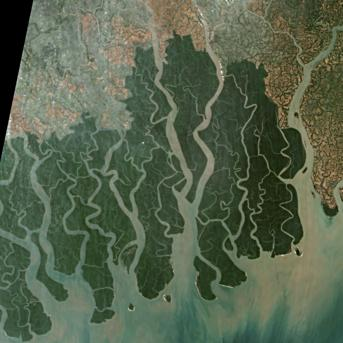
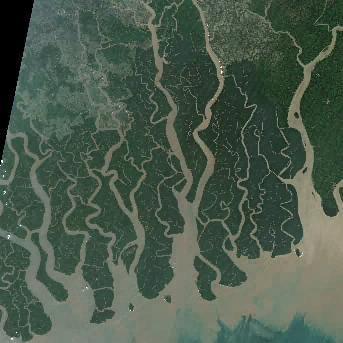
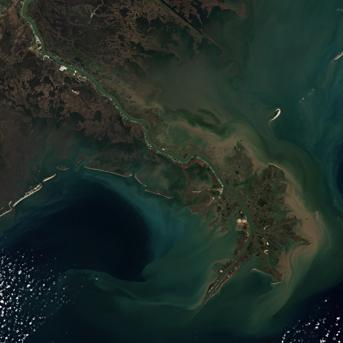
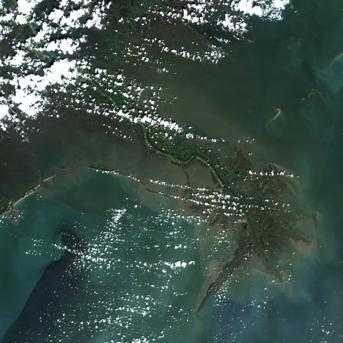

🎯 This project applies unsupervised machine learning techniques to detect **water bodies in the delta** from satellite imagery. Specifically, we use different water indixes (AWEI, MNDWI and NDWI) with **Sentinel-2** data and perform k-means clustering to extract water features. The analysis focuses on two different delta regions: **the Bengal Delta** and **the Mississippi River Delta**.

# 📚 Main content
1. **Preparation**: Download the data from Copernicus and upload it to Google drive.
2. **Basic Masks**: Generate the masks according to different water index formulas (AWEI, MNDWI and NDWI). And compare the masks for flood period and non-flood period in the same delta area.
3. **Unsupervised Method**: Using **K-mean** classify the water bodies and non-water bodies based on that three different methods.
4. **Evaluate the Environmental Cost**: Assess the possible environmental costs of this project for sustainabalility, such as carbon emissions.

# 📍 Location selection
Climate change is intensifying tropical cyclones, accelerating sea level rise and increasing coastal flooding (Ghosh et al., 2019). River deltas are particularly vulnerable to flooding due to their low elevation and densely populated cities (Edmonds et al., 2020). Therefore, the **Bengal Delta** and **Mississippi River Delta** are selected as the research objects, and the distribution of water bodies of these two areas are analysed by three different water indexes and unsupervised methods with Sentinel-2 data.

# 📝 Preparatory work
- **Downloaded** the data from the **Copernicus Dataspace** according to the time and location.
- **Chose** the same area of the Bengal Delta in October 2023 and December 2024 and the same area of the Mississippi River Delta in September and December 2024 for comparison. Then **upload the data** to the drive.
- In order to finally **calculate the environmental cost** of this study, using `time` at the beginning and end of the operation to calculate all the running time.
- **Connect** colab and drive to load data.
- Download the **`rastreio` database** for later reading and processing raster data.

In [ ]:
import time
start = time.time()

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [ ]:
! pip install rasterio

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 22.2/22.2 MB 30.9 MB/s eta 0:00:00


In [ ]:
pip install netCDF4

Traceback (most recent call last):
  File "/usr/local/lib/python3.11/dist-packages/pip/_internal/cli/base_command.py", line 179, in exc_logging_wrapper
    status = run_func(*args)
             ^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.11/dist-packages/pip/_internal/cli/req_command.py", line 67, in wrapper
    return func(self, options, args)
           ^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.11/dist-packages/pip/_internal/commands/install.py", line 362, in run
    resolver = self.make_resolver(
               ^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.11/dist-packages/pip/_internal/cli/req_command.py", line 177, in make_resolver
    return pip._internal.resolution.resolvelib.resolver.Resolver(
           ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.11/dist-packages/pip/_internal/resolution/resolvelib/resolver.py", line 58, in __init__
    self.factory = Factory(
                   ^^^^^^^^
  File "/usr/local/lib/py

# 📍 Bengal Delta
As the largest delta in the world, this region is low-lying and densely covered with water networks, which is an important area for studying water distribution, hydrological changes and flood monitoring (Akter et al., 2016).

The flood period is from June to October, so I choose S2 data from September 2023 and December 2024 as the research object.

Load the base path of the data, which can be changed according to the individual's situation, then the band information is extracted separately according to the band required by different methods. In order to simplify the path, I have extracted the data image that I need to use separately, that the `Bangladesh_10/` includes `S2A_MSIL2A_20231028T042901_N0510_R133_T45QYE_20240910T030449.SAFE/GRANULE/L2A_T45QYE_A043602_20231028T043908/IMG_DATA` and the `Bangladesh_12/` includes `S2A_MSIL2A_20241231T043201_N0511_R133_T45QYE_20241231T073201.SAFE/GRANULE/L2A_T45QYE_A049751_20241231T043156/IMG_DATA`, you might need the full path if  using directly downloaded files.

Here I am using L2A data, which has been corrected for the atmosphere and more suitable for surface analysis.

In [ ]:
# Specify file paths for Bengal Delta
BD_10_base_path = "/content/drive/MyDrive/GEOL0069/Final/Bangladesh_10/"
BD_12_base_path = "/content/drive/MyDrive/GEOL0069/Final/Bangladesh_12/"

## 💧 Automated Water Extraction Index (AWEI)

Automated Water Extraction Index (AWEI) is a remote sensing index specially used to automatically extract water areas. Its main goal is to enhance the difference between water bodies and non-water bodies (such as shadows, wetlands, urban features, etc.). AWEI has two commonly used formulas, due to the complex environment in the delta region, there are many shadows that can interfere the classification. Therefore, here I use the shadow optimised version, it combines several bands, including **blue band (B2), green band (B3), near-infrared band (B8 or B8A), and two short-wave infrared bands (B11 and B12)**, taking into account the reflection characteristics of different bands on the water body. According to Feyisa in 2014 the usual formula is:

$$\text{AWEI} = {\text{Blue} + 2.5 * \text{Green}} - 1.5 * ({\text{NIR} + \text{SWIR1}}) - 0.25 * {\text{SWIR2}},$$ which is $$\text{AWEI} = {\text{B2} + 2.5 * \text{B3}} - 1.5 * ({\text{B8} + \text{B11}}) - 0.25 * {\text{B12}}.$$

The values of AWEI:
- Close to **1.0**: high probability is judged as water body.
- About **0.5 to 0.8**: may be shallow water or wetland.
- Close to **0.0**: most likely non-water body (ground, vegetation).


### 🗺️ AWEI Basic Masks
The following code uses the S2 data to analyse the AWEI of the Bengal Delta in October and December and generate the binary masks about water bodies. In order to facilitate later running, and to avoid the problem of insufficient RAM, save the processed data and load the data before visualising the image. Finally, using confusion matrix compare the differences between the water bodies analysis masks of the two months. During this process, threshold is set to 0.

In [ ]:
import rasterio
import numpy as np

# Specify file paths to the bands being used
BD_10_bands_paths = {
    'B8': BD_10_base_path + 'R20m/T45QYE_20231028T042901_B8A_20m.jp2',  # NIR
    'B3': BD_10_base_path + 'R20m/T45QYE_20231028T042901_B03_20m.jp2',  # Green
    'B11': BD_10_base_path + 'R20m/T45QYE_20231028T042901_B11_20m.jp2',  # SWIR1
    'B12': BD_10_base_path + 'R20m/T45QYE_20231028T042901_B12_20m.jp2', # SWIR2
    'B2': BD_10_base_path + 'R20m/T45QYE_20231028T042901_B02_20m.jp2' # Blue
}
# Read and stack the band images
BD_10_band_data = []
for band in ['B3', 'B8', 'B11', 'B12', 'B2']:
    with rasterio.open(BD_10_bands_paths[band]) as src:
        BD_10_band_data.append(src.read(1))


# Stack bands and create a mask for valid data (non-zero values in all bands)
BD_10_band_stack = np.dstack(BD_10_band_data)
BD_10_valid_data_mask = np.all(BD_10_band_stack > 0, axis=2)



# Calculating the AWEI
BD_10_green_band = BD_10_band_stack[:,:,0].astype(np.float16)  # B03
BD_10_nir_band = BD_10_band_stack[:,:,1].astype(np.float16)    # B08A
BD_10_swir_band = BD_10_band_stack[:,:,2].astype(np.float16)   # B11
BD_10_swir2_band = BD_10_band_stack[:,:,3].astype(np.float16)   # B12
BD_10_blue_band = BD_10_band_stack[:,:,4].astype(np.float16)   # B02

BD_10_awei = BD_10_blue_band+2.5*BD_10_green_band-1.5*(BD_10_nir_band+BD_10_swir_band)-0.25*BD_10_swir2_band

# Thresholding the AWEI
threshold = 0.0 # Threshold value
BD_10_mask_awei = np.where(BD_10_awei > threshold, 1, 0).astype(np.uint8)

In [ ]:
import rasterio
import numpy as np

# Define file path to save the AWEI mask
BD_10_mask_awei_path = BD_10_base_path +'BD_10_mask_awei.tif'

# Save the AWEI mask as a GeoTIFF
with rasterio.open(BD_10_bands_paths['B3']) as src:  # Read one of the source bands to get metadata
    meta = src.meta  # Get metadata from the source image (e.g., CRS, transform, etc.)

    # Update metadata for the new file (1 band, uint8 type)
    meta.update(dtype=rasterio.uint8, count=1)

    # Save the AWEI mask as GeoTIFF
    with rasterio.open(BD_10_mask_awei_path, 'w', **meta) as dst:
        dst.write(BD_10_mask_awei, 1)  # Write the AWEI mask to the first band


In [ ]:
import rasterio
import numpy as np

# Specify file paths to the bands being used
BD_12_bands_paths = {
    'B8': BD_12_base_path + 'R20m/T45QYE_20241231T043201_B8A_20m.jp2',  # NIR
    'B3': BD_12_base_path + 'R20m/T45QYE_20241231T043201_B03_20m.jp2',  # Green
    'B11': BD_12_base_path + 'R20m/T45QYE_20241231T043201_B11_20m.jp2',  # SWIR
    'B12': BD_12_base_path + 'R20m/T45QYE_20241231T043201_B12_20m.jp2', # SWIR2
    'B2': BD_12_base_path + 'R20m/T45QYE_20241231T043201_B02_20m.jp2' # Blue
}
# Read and stack the band images
BD_12_band_data = []
for band in ['B3', 'B8', 'B11', 'B12','B2']:
    with rasterio.open(BD_12_bands_paths[band]) as src:
        BD_12_band_data.append(src.read(1))


# Stack bands and create a mask for valid data (non-zero values in all bands)
BD_12_band_stack = np.dstack(BD_12_band_data)
BD_12_valid_data_mask = np.all(BD_12_band_stack > 0, axis=2)


# Calculating the
BD_12_green_band = BD_12_band_stack[:,:,0].astype(np.float16)  # B03
BD_12_nir_band = BD_12_band_stack[:,:,1].astype(np.float16)    # B08
BD_12_swir_band = BD_12_band_stack[:,:,2].astype(np.float16)   # B11
BD_12_swir2_band = BD_12_band_stack[:,:,3].astype(np.float16)   # B12
BD_12_blue_band = BD_12_band_stack[:,:,4].astype(np.float16)   # B02

BD_12_awei = BD_12_blue_band+2.5*BD_12_green_band-1.5*(BD_12_nir_band+BD_12_swir_band)-0.25*BD_12_swir2_band

# Thresholding the AWEI
threshold = 0.0 # Threshold value
BD_12_mask_awei = np.where(BD_12_awei > threshold, 1, 0).astype(np.uint8)

In [ ]:
import rasterio
import numpy as np

# Define file path to save the AWEI mask
BD_12_mask_awei_path = BD_12_base_path +'BD_12_mask_awei.tif'

# Save the AWEI mask as a GeoTIFF
with rasterio.open(BD_12_bands_paths['B3']) as src:  # Read one of the source bands to get metadata
    meta = src.meta  # Get metadata from the source image (e.g., CRS, transform, etc.)

    # Update metadata for the new file (1 band, uint8 type)
    meta.update(dtype=rasterio.uint8, count=1)

    # Save the AWEI mask as GeoTIFF
    with rasterio.open(BD_12_mask_awei_path, 'w', **meta) as dst:
        dst.write(BD_12_mask_awei, 1)  # Write the AWEI mask to the first band


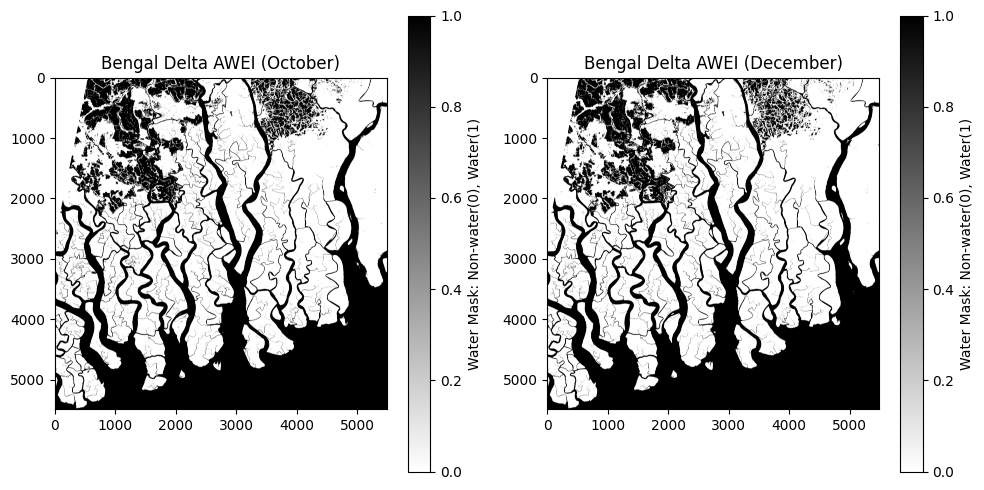

In [ ]:
import rasterio
import matplotlib.pyplot as plt

BD_10_mask_awei_path = '/content/drive/MyDrive/GEOL0069/Final/Bangladesh_10/BD_10_mask_awei.tif'
BD_12_mask_awei_path = '/content/drive/MyDrive/GEOL0069/Final/Bangladesh_12/BD_12_mask_awei.tif'

# Load the saved AWEI mask from the GeoTIFF file
with rasterio.open(BD_10_mask_awei_path) as src:
    BD_10_mask_awei = src.read(1)  # Read the first band

with rasterio.open(BD_12_mask_awei_path) as src:
    BD_12_mask_awei = src.read(1)  # Read the first band

# Plot the AWEI mask
plt.figure(figsize=(10,5))

plt.subplot(1, 2, 1)
plt.title('Bengal Delta AWEI (October)')
plt.imshow(BD_10_mask_awei, cmap='binary', vmin=0, vmax=1)
plt.colorbar(label='Water Mask: Non-water(0), Water(1)')

plt.subplot(1, 2, 2)
plt.title('Bengal Delta AWEI (December)')
plt.imshow(BD_12_mask_awei, cmap='binary', vmin=0, vmax=1)
plt.colorbar(label='Water Mask: Non-water(0), Water(1)')

plt.tight_layout()
# plt.savefig("/content/drive/MyDrive/GEOL0069/Final/BD_AWEI_Mask_threshold.png")
plt.show()

plt.close()


Classification Report:
               precision    recall  f1-score   support

           0       0.98      0.99      0.98  17782042
           1       0.98      0.97      0.97  12358058

    accuracy                           0.98  30140100
   macro avg       0.98      0.98      0.98  30140100
weighted avg       0.98      0.98      0.98  30140100



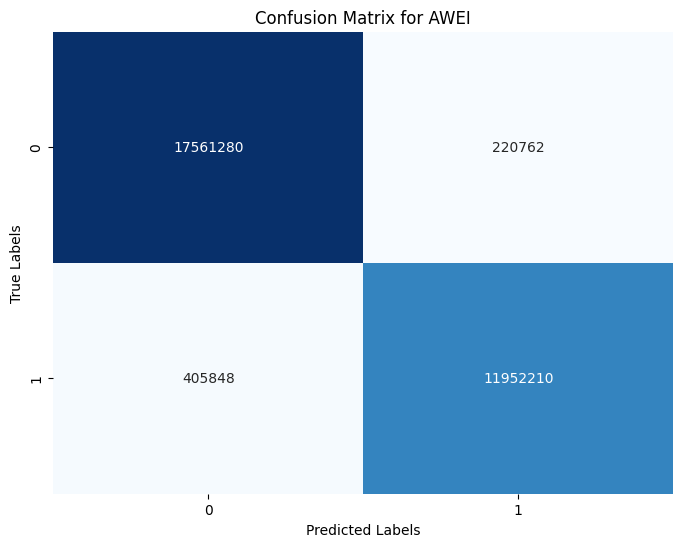

Accuracy: 0.98


In [ ]:
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.metrics import confusion_matrix, accuracy_score, classification_report


# Set threshold
threshold = 0.0

# Calculate the binary mask
BD_10_mask_awei = (BD_10_mask_awei > threshold).astype(np.uint8)
BD_12_mask_awei = (BD_12_mask_awei > threshold).astype(np.uint8)

# Flattening mask array
BD_10_mask_awei_flat = BD_10_mask_awei.flatten()
BD_12_mask_awei_flat = BD_12_mask_awei.flatten()

# Calculate confusion matrix
cm_awei = confusion_matrix(BD_10_mask_awei_flat, BD_12_mask_awei_flat)

# Calculate accuracy
accuracy = accuracy_score(BD_10_mask_awei_flat, BD_12_mask_awei_flat)

# display classification report
report = classification_report(BD_10_mask_awei_flat, BD_12_mask_awei_flat)
print("Classification Report:\n", report)

# Plot confusion matrix
plt.figure(figsize=(8, 6))
sns.heatmap(cm_awei, annot=True, fmt="d", cmap="Blues", cbar=False)
plt.title("Confusion Matrix for AWEI")
plt.xlabel("Predicted Labels")
plt.ylabel("True Labels")
plt.show()

# Print accuracy score
print(f"Accuracy: {accuracy:.2f}")


✅ The masks are similar, but there are slightly differences on the right. This might be caused by the influence of shadows or sediments. According to the report, the accuracy rate is as high as 98%, which means that the water bodies in the Bangal Delta during the two time periods are not very different.

### 🔧 K-means Clustering Algorithm Based on AWEI
**K-means clustering** is an **unsupervised learning algorithm** used to divide a data set into a set of k groups (or clusters), where k represents the number of groups pre-specified by the analyst. It classifies data points based on the similarity of the data features (MacQueen, 1967). The basic idea is to define k centers of mass, one for each cluster, and then assign each data point to the nearest center of mass while keeping the center of mass as small as possible.

The following code first visualises several bands required by AWEI, **Band 3 (Green), Band 8 (NIR), Band 11 (SWIR 1) and Band 12 (SWIR 2)**, then performs k-mean operations and visualises the results, compares the k-mean mask based on AWEI data with the basic mask, and generates the comparation results with confusion matrix.

There are two methods using k-mean here. One is to calculate the value of AWEI using band and then using k-means to classify water bodies based on the value of AWEI. The other is to classify the water bodies based on the bands required by AWEI using k-mean. I also generate masks by the two methods respectively and compare them using the confusion matrix here.

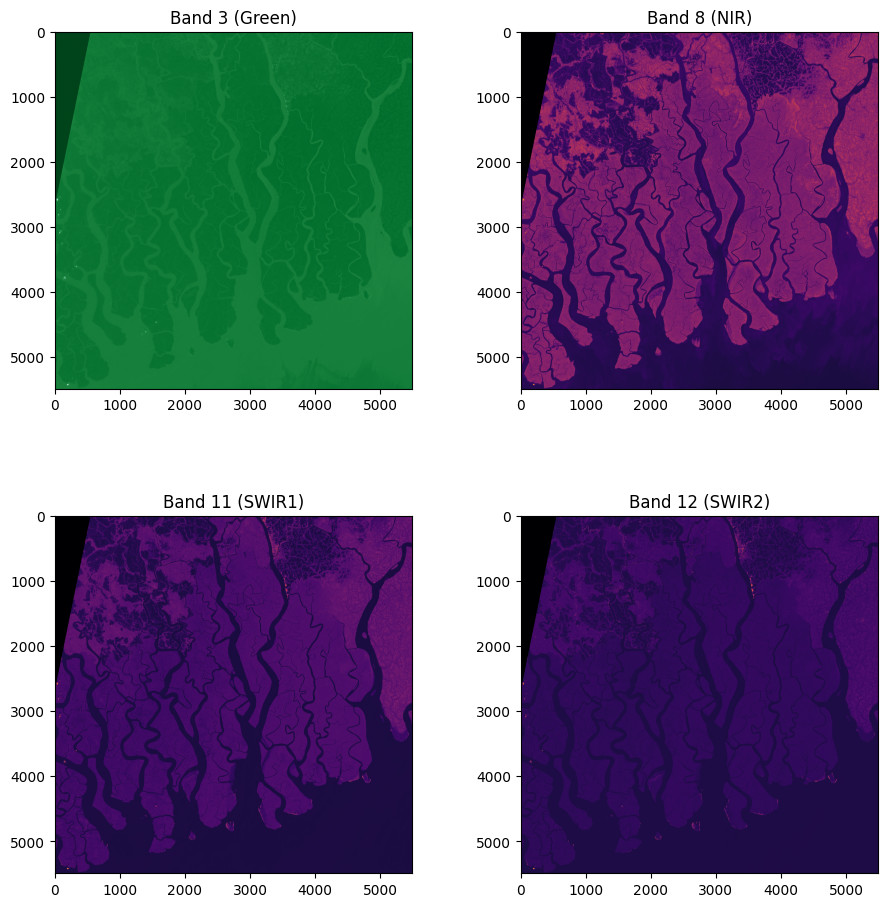

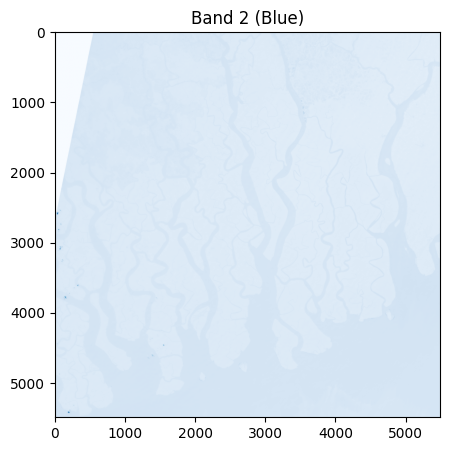

In [ ]:
import rasterio
import matplotlib.pyplot as plt

# Visual representation of bands
fig, axs = plt.subplots(2, 2)
ax1, ax2, ax3, ax4 = axs.ravel()

ax1.imshow(BD_10_band_stack[:,:,0], cmap='BuGn_r')  # Plot on the first subplot (ax1)
ax1.set_title('Band 3 (Green)')

ax2.imshow(BD_10_band_stack[:,:,1], cmap= 'inferno')  # Plot on the second subplot (ax2)
ax2.set_title('Band 8 (NIR)')


ax3.imshow(BD_10_band_stack[:,:,2], cmap= 'inferno')  # Plot on the third subplot (ax3)
ax3.set_title('Band 11 (SWIR1)')

ax4.imshow(BD_10_band_stack[:,:,3], cmap= 'inferno')  # Plot on the third subplot (ax3)
ax4.set_title('Band 12 (SWIR2)')

plt.tight_layout()
fig.set_size_inches(10, 10)
plt.show()

plt.figure(figsize=(5,5))
plt.title('Band 2 (Blue)')
plt.imshow(BD_10_band_stack[:,:,4], cmap='Blues')
plt.show()



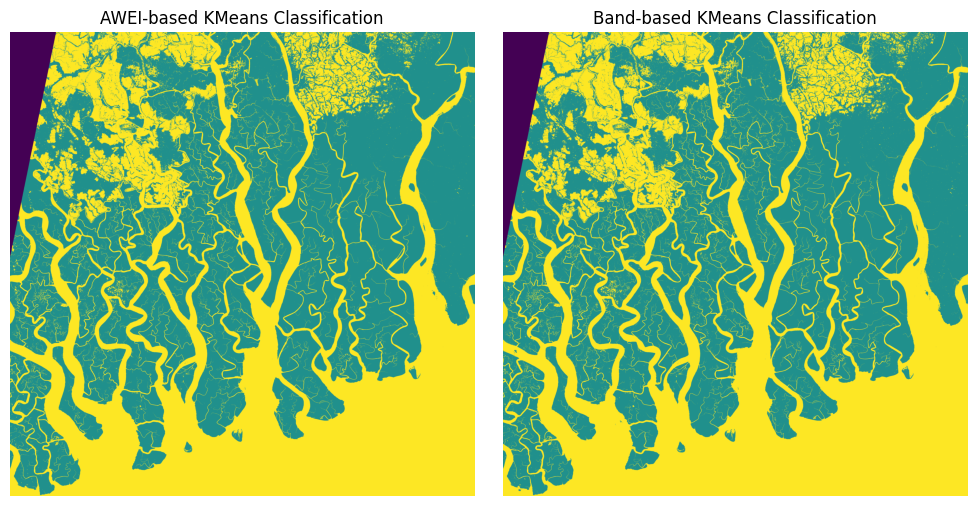

In [ ]:
import numpy as np
from sklearn.cluster import KMeans
import matplotlib.pyplot as plt

# Method A: Use AWEI for KMeans

X_awei = BD_10_awei[BD_10_valid_data_mask].reshape(-1, 1)
kmeans_awei = KMeans(n_clusters=2, random_state=0).fit(X_awei)
labels_awei = kmeans_awei.labels_

# Ensure that label=1 is a water body (usually the AWEI value is small)
if X_awei[labels_awei == 0].mean() > X_awei[labels_awei == 1].mean():
    labels_awei = 1 - labels_awei

# Create a full image mask
labels_image_awei = np.full(BD_10_awei.shape, -1, dtype=int)
labels_image_awei[BD_10_valid_data_mask] = labels_awei


# Method B: Use bands for KMeans (B2, B3, B8A, B11, B12)
X_band = BD_10_band_stack[BD_10_valid_data_mask]
kmeans_band = KMeans(n_clusters=2, random_state=0).fit(X_band)
labels_band = kmeans_band.labels_

# Ensure that label=1 is the water body (determine the one with the smallest mean of the green band)
if X_band[labels_band == 0, 0].mean() > X_band[labels_band == 1, 0].mean():
    labels_band = 1 - labels_band

labels_image_band = np.full(BD_10_valid_data_mask.shape, -1, dtype=int)
labels_image_band[BD_10_valid_data_mask] = labels_band


# Visual Comparison

fig, axes = plt.subplots(1, 2, figsize=(10, 5))

axes[0].imshow(labels_image_awei, cmap='viridis')
axes[0].set_title("AWEI-based KMeans Classification")
axes[0].axis('off')

axes[1].imshow(labels_image_band, cmap='viridis')
axes[1].set_title("Band-based KMeans Classification")
axes[1].axis('off')

plt.tight_layout()
plt.show()

Classification Report:
               precision    recall  f1-score   support

           0       0.99      1.00      0.99  16631913
           1       1.00      0.99      0.99  12779277

    accuracy                           0.99  29411190
   macro avg       0.99      0.99      0.99  29411190
weighted avg       0.99      0.99      0.99  29411190



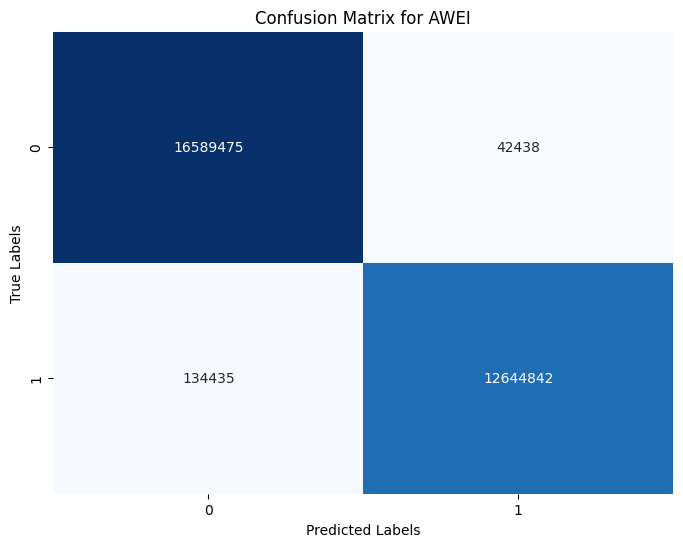

Accuracy: 0.99


In [ ]:
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.metrics import confusion_matrix, accuracy_score, classification_report


# Calculate the binary mask
BD_awei = (labels_image_band > threshold).astype(np.uint8)
BD_awei_kmean = (labels_image_awei > threshold).astype(np.uint8)

valid_mask = (labels_image_awei != -1)

# Flattening mask array
BD_awei_flat = BD_awei[valid_mask].flatten()
BD_awei_kmean_flat = labels_image_awei[valid_mask].flatten()

# Calculate confusion matrix
cm_awei = confusion_matrix(BD_awei_flat, BD_awei_kmean_flat )

# Calculate accuracy
accuracy = accuracy_score(BD_awei_flat, BD_awei_kmean_flat )

# display classification report
report = classification_report(BD_awei_flat, BD_awei_kmean_flat )
print("Classification Report:\n", report)

# Plot confusion matrix
plt.figure(figsize=(8, 6))
sns.heatmap(cm_awei, annot=True, fmt="d", cmap="Blues", cbar=False)
plt.title("Confusion Matrix for AWEI")
plt.xlabel("Predicted Labels")
plt.ylabel("True Labels")
plt.show()

# Print accuracy score
print(f"Accuracy: {accuracy:.2f}")

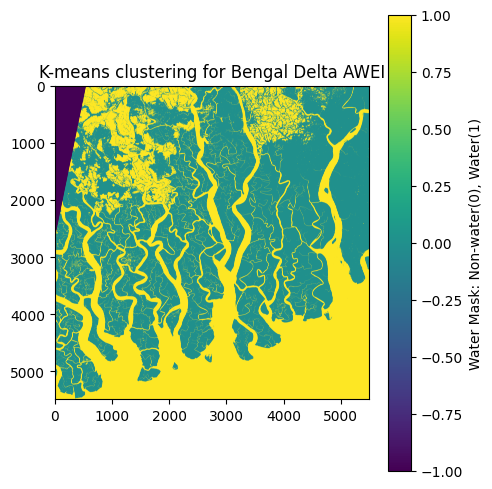

In [ ]:
import rasterio
import numpy as np
from sklearn.cluster import KMeans
import matplotlib.pyplot as plt

# Reshape for K-means, only including valid data
X_awei = BD_10_awei[BD_10_valid_data_mask].reshape((-1, 1))

# K-means clustering
kmeans = KMeans(n_clusters=2, random_state=0).fit(X_awei)
labels = kmeans.labels_

mean_cluster_values = [X_awei[labels == i].mean() for i in range(2)]
if mean_cluster_values[0] > mean_cluster_values[1]:
    labels = 1 - labels


# Create an empty array for the result, filled with a no-data value (e.g., -1)
labels_image_awei = np.full(BD_10_band_stack.shape[:2], -1, dtype=int)

# Place cluster labels in the locations corresponding to valid data
labels_image_awei[BD_10_valid_data_mask] = labels


# Plot the AWEI mask
plt.figure(figsize=(5,5))

plt.imshow(labels_image_awei, cmap='viridis')
plt.title('K-means clustering for Bengal Delta AWEI')
plt.colorbar(label='Water Mask: Non-water(0), Water(1)')

plt.tight_layout()
#plt.savefig("/content/drive/MyDrive/GEOL0069/Final/BD_AWEI_kmean.png")
plt.show()

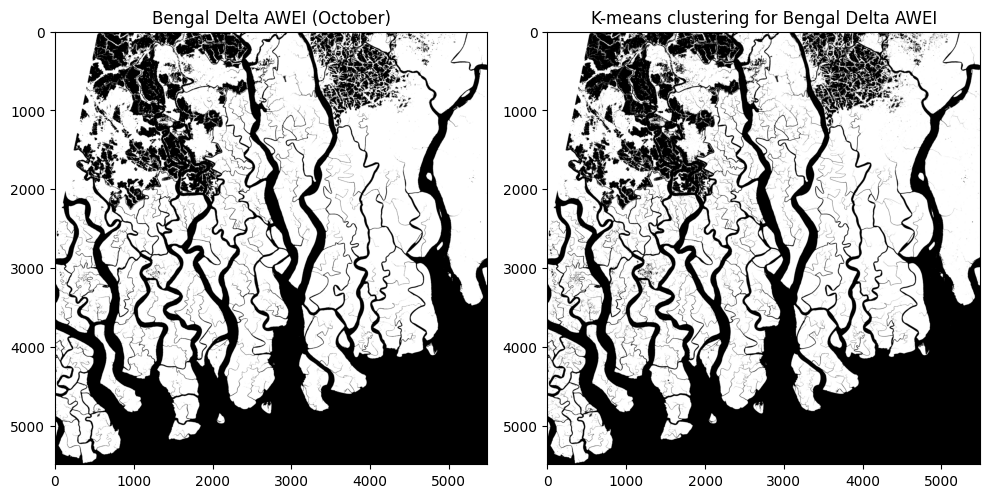

In [ ]:
# Load the saved AWEI mask from the GeoTIFF file
BD_10_mask_awei_path = '/content/drive/MyDrive/GEOL0069/Final/Bangladesh_10/BD_10_mask_awei.tif'
with rasterio.open(BD_10_mask_awei_path) as src:
    BD_10_mask_awei = src.read(1)  # Read the first band

# Plot the AWEI mask
plt.figure(figsize=(10,5))

plt.subplot(1, 2, 1)
plt.title('Bengal Delta AWEI (October)')
plt.imshow(BD_10_mask_awei, cmap='binary',vmin=0, vmax=1)

plt.subplot(1, 2, 2)
plt.imshow(labels_image_awei, cmap='binary', vmin=0, vmax=1)
plt.title('K-means clustering for Bengal Delta AWEI')

plt.tight_layout()
# plt.savefig("/content/drive/MyDrive/GEOL0069/Final/BD_AWEI.png")
plt.show()

Classification Report:
               precision    recall  f1-score   support

           0       0.99      0.98      0.99  17053282
           1       0.97      0.99      0.98  12357908

    accuracy                           0.98  29411190
   macro avg       0.98      0.98      0.98  29411190
weighted avg       0.98      0.98      0.98  29411190



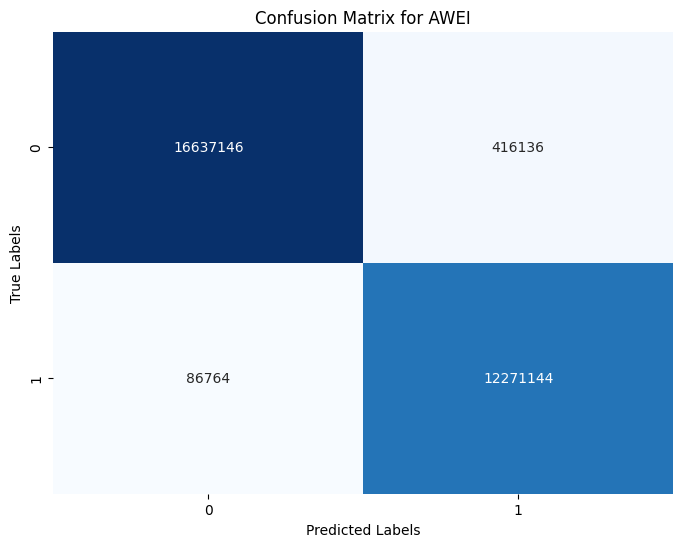

Accuracy: 0.98


In [ ]:
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.metrics import confusion_matrix, accuracy_score, classification_report


# Calculate the binary mask
BD_awei = (BD_10_mask_awei > threshold).astype(np.uint8)
BD_awei_kmean = (labels_image_awei > threshold).astype(np.uint8)

valid_mask = (labels_image_awei != -1)

# Flattening mask array
BD_awei_flat = BD_awei[valid_mask].flatten()
BD_awei_kmean_flat = labels_image_awei[valid_mask].flatten()

# Calculate confusion matrix
cm_awei = confusion_matrix(BD_awei_flat, BD_awei_kmean_flat )

# Calculate accuracy
accuracy = accuracy_score(BD_awei_flat, BD_awei_kmean_flat )

# display classification report
report = classification_report(BD_awei_flat, BD_awei_kmean_flat )
print("Classification Report:\n", report)

# Plot confusion matrix
plt.figure(figsize=(8, 6))
sns.heatmap(cm_awei, annot=True, fmt="d", cmap="Blues", cbar=False)
plt.title("Confusion Matrix for AWEI")
plt.xlabel("Predicted Labels")
plt.ylabel("True Labels")
plt.show()

# Print accuracy score
print(f"Accuracy: {accuracy:.2f}")

✅ The results for two methods show that they are very similar. Since the purpose of this project is to distinguish between water bodies and non-water bodies, classification based on the values calculated by AWEI are more accurate, while the one based on band may be affected by other categories. Therefore, in the subsequent calculations, the first method based on the combination of the calculated values and the k-mean algorithm is used for classification.

In addition, it can be seen from the masks that the water distribution of the k-mean mask is more detailed than that of the basic mask, and the accuracy of the two masks is up to 98%, which indicates that the method combined with k-mean and water index can effectively improve the identification ability.

## 💧 Modified Normalised Difference Water Index (MNDWI)

Modified Normalised Difference Water Index (MNDWI) is a widely used index for water extraction, especially suitable for water extraction in urban, wetland and complex background. In the estuary or wetland environment such as delta, water bodies are often mixed with wetlands, vegetation and cities, so MNDWI can provide better water extraction effect. It relies on the difference between **the green band (B3) and the short-wave infrared band (B11)**.
According to the Xu in 2006, the formula of MNDWI is

$$\text{MNDWI} = \frac{\text{Green} - \text{SWIR1}}{\text{Green} + \text{SWIR1}}.$$
Which is
$$\text{MNDWI} = \frac{\text{B3} - \text{B11}}{\text{B3} + \text{B11}}.$$

The values of MNDWI here:
- MNDWI closes to **1**: Classified as **water**
- MNDWI closes to **0**: Classified as **non-water**


### 🗺️ MNDWI Basic Masks
The code below analyses the October and December MNDWI of the Bengal Delta using S2 data and generates a binary mask of the water bodies. And then analysis the difference of the masks by using the confusion matrix to compare the water bodies of two months. During this process, the threshold is set to 0.

In [ ]:
import rasterio
import matplotlib.pyplot as plt

# Calculate MNDWI
BD_10_mndwi = (BD_10_green_band - BD_10_swir_band) / (BD_10_green_band + BD_10_swir_band + 1e-6)  # Adding 1e-6 to avoid division by zero

# Thresholding the MNDWI
threshold = 0.0 # Threshold value
BD_10_mask_mndwi = np.where(BD_10_mndwi > threshold, 1, 0).astype(np.uint8)


In [ ]:
import rasterio
import numpy as np

# Define file path to save the MNDWI mask
BD_10_mask_mndwi_path = BD_10_base_path +'BD_10_mask_mndwi.tif'

# Save the MNDWI mask as a GeoTIFF
with rasterio.open(BD_10_bands_paths['B3']) as src:  # Read one of the source bands to get metadata
    meta = src.meta  # Get metadata from the source image (e.g., CRS, transform, etc.)

    # Update metadata for the new file (1 band, uint8 type)
    meta.update(dtype=rasterio.uint8, count=1)

    # Save the MNDWI mask as GeoTIFF
    with rasterio.open(BD_10_mask_mndwi_path, 'w', **meta) as dst:
        dst.write(BD_10_mask_mndwi, 1)  # Write the MNDWI mask to the first band


In [ ]:
# Calculate MNDWI
BD_12_mndwi = (BD_12_green_band - BD_12_swir_band) / (BD_12_green_band + BD_12_swir_band + 1e-6)  # Adding epsilon to avoid division by zero

# Thresholding the MNDWI
threshold = 0.0 # Threshold value
BD_12_mask_mndwi = np.where(BD_12_mndwi > threshold, 1, 0).astype(np.uint8)

In [ ]:
import rasterio
import numpy as np

# Define file path to save the MNDWI mask
BD_12_mask_mndwi_path = BD_12_base_path +'BD_12_mask_mndwi.tif'

# Save the MNDWI mask as a GeoTIFF
with rasterio.open(BD_12_bands_paths['B3']) as src:  # Read one of the source bands to get metadata
    meta = src.meta  # Get metadata from the source image (e.g., CRS, transform, etc.)

    # Update metadata for the new file (1 band, uint8 type)
    meta.update(dtype=rasterio.uint8, count=1)

    # Save the MNDWI mask as GeoTIFF
    with rasterio.open(BD_12_mask_mndwi_path, 'w', **meta) as dst:
        dst.write(BD_12_mask_mndwi, 1)  # Write the MNDWI mask to the first band

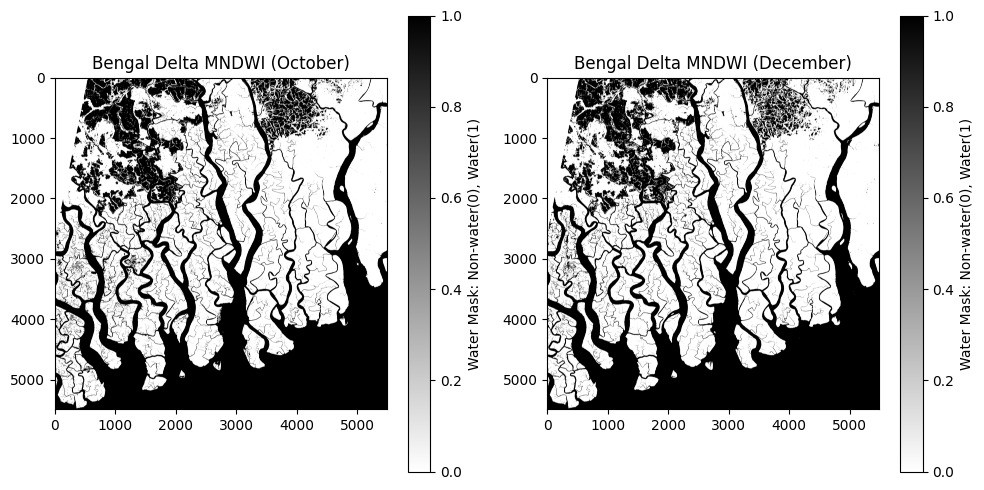

In [ ]:
import rasterio
import matplotlib.pyplot as plt

BD_10_mask_mndwi_path = '/content/drive/MyDrive/GEOL0069/Final/Bangladesh_10/BD_10_mask_mndwi.tif'
BD_12_mask_mndwi_path = '/content/drive/MyDrive/GEOL0069/Final/Bangladesh_12/BD_12_mask_mndwi.tif'

# Load the saved MNDWI mask from the GeoTIFF file
with rasterio.open(BD_10_mask_mndwi_path) as src:
    BD_10_mask_mndwi = src.read(1)  # Read the first band

with rasterio.open(BD_12_mask_mndwi_path) as src:
    BD_12_mask_mndwi = src.read(1)  # Read the first band

# Plot the MNDWI mask
plt.figure(figsize=(10,5))

plt.subplot(1, 2, 1)
plt.title('Bengal Delta MNDWI (October)')
plt.imshow(BD_10_mask_mndwi, cmap='binary', vmin=0, vmax=1)
plt.colorbar(label='Water Mask: Non-water(0), Water(1)')

plt.subplot(1, 2, 2)
plt.title('Bengal Delta MNDWI (December)')
plt.imshow(BD_12_mask_mndwi, cmap='binary', vmin=0, vmax=1)
plt.colorbar(label='Water Mask: Non-water(0), Water(1)')

plt.tight_layout()
# plt.savefig("/content/drive/MyDrive/GEOL0069/Final/BD_MNDWI_Mask.png")
plt.show()

plt.close()

Classification Report:
               precision    recall  f1-score   support

           0       0.96      0.98      0.97  17165441
           1       0.97      0.95      0.96  12974659

    accuracy                           0.97  30140100
   macro avg       0.97      0.97      0.97  30140100
weighted avg       0.97      0.97      0.97  30140100



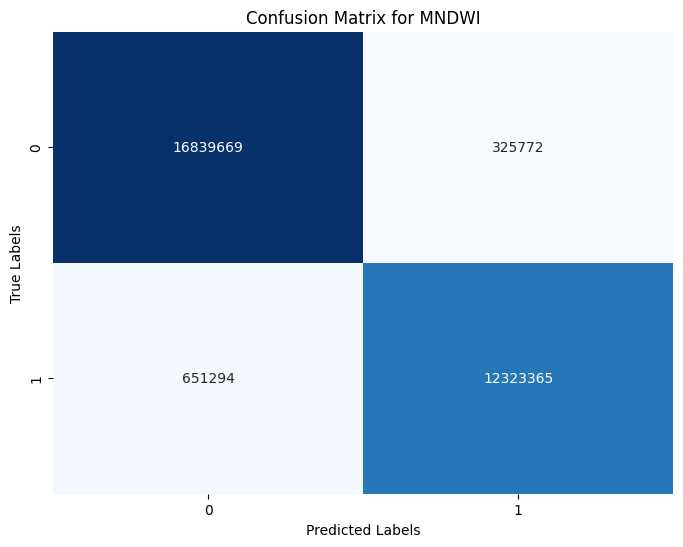

Accuracy: 0.97


In [ ]:
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.metrics import confusion_matrix, accuracy_score, classification_report


# Set threshold
threshold = 0.0

# Calculate the binary mask
BD_10_mask_mndwi = (BD_10_mask_mndwi > threshold).astype(np.uint8)
BD_12_mask_mndwi = (BD_12_mask_mndwi > threshold).astype(np.uint8)

# Flattening mask array
BD_10_mask_mndwi_flat = BD_10_mask_mndwi.flatten()
BD_12_mask_mndwi_flat = BD_12_mask_mndwi.flatten()

# Calculate confusion matrix
cm_mndwi = confusion_matrix(BD_10_mask_mndwi_flat, BD_12_mask_mndwi_flat)

# calculate accuracy
accuracy = accuracy_score(BD_10_mask_mndwi_flat, BD_12_mask_mndwi_flat)

# Display classification report
report = classification_report(BD_10_mask_mndwi_flat, BD_12_mask_mndwi_flat)
print("Classification Report:\n", report)

# Plot confusion matrix
plt.figure(figsize=(8, 6))
sns.heatmap(cm_mndwi, annot=True, fmt="d", cmap="Blues", cbar=False)
plt.title("Confusion Matrix for MNDWI")
plt.xlabel("Predicted Labels")
plt.ylabel("True Labels")
plt.show()

# Print accuracy score
print(f"Accuracy: {accuracy:.2f}")

✅ As the shown in the masks, there is not much difference between them, and confusion matrix also presents a high accuracy rate, 97%, which indicates that the water bodies in the Bengal Delta changes little in these two periods.

### 🔧 K-means Clustering Algorithm Based on MNDWI
The following code visualises several bands needed to compute MNDWI, **Band 3 (Green) and Band 11 (SWIR1)**, then performs MNDWI-based k-mean operations and visualises the results, compares the MNDWI data-based k-mean mask and the basic mask, and generates a comparison with a confusion matrix.

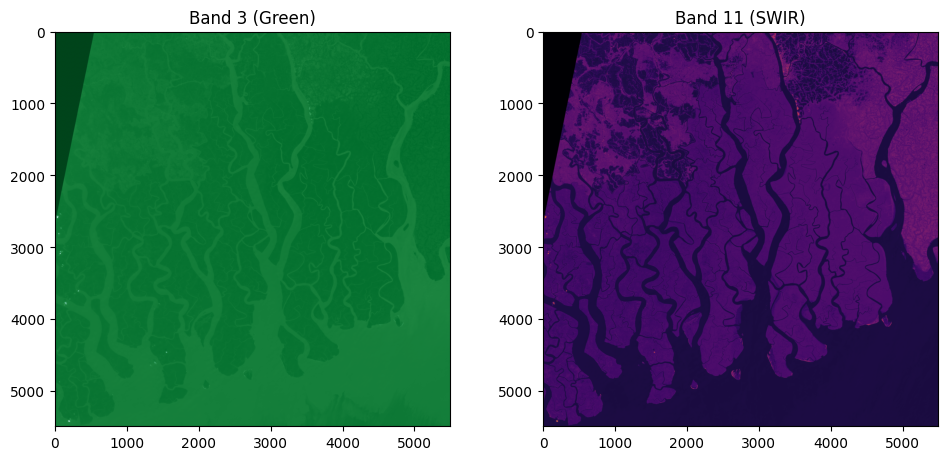

In [ ]:
import rasterio
import matplotlib.pyplot as plt

# Visual representation of bands
fig, (ax1, ax2) = plt.subplots(1, 2)

ax1.imshow(BD_10_band_stack[:,:,0], cmap='BuGn_r')  # Plot on the first subplot (ax1)
ax1.set_title('Band 3 (Green)')

ax2.imshow(BD_10_band_stack[:,:,2], cmap= 'inferno')  # Plot on the second subplot (ax2)
ax2.set_title('Band 11 (SWIR)')


plt.tight_layout()
fig.set_size_inches(10, 5)
plt.show()

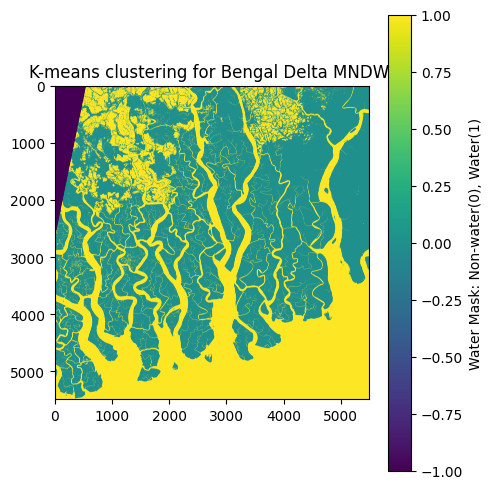

In [ ]:
import rasterio
import numpy as np
from sklearn.cluster import KMeans
import matplotlib.pyplot as plt

# Reshape for K-means, only including valid data
X_mndwi = BD_10_mndwi[BD_10_valid_data_mask].reshape((-1, 1))

# K-means clustering
kmeans = KMeans(n_clusters=2, random_state=0).fit(X_mndwi)
labels = kmeans.labels_

mean_cluster_values = [X_mndwi[labels == i].mean() for i in range(2)]
if mean_cluster_values[0] > mean_cluster_values[1]:
    labels = 1 - labels

# Create an empty array for the result, filled with a no-data value (e.g., -1)
labels_image_mndwi = np.full(BD_10_band_stack.shape[:2], -1, dtype=int)

# Place cluster labels in the locations corresponding to valid data
labels_image_mndwi[BD_10_valid_data_mask] = labels


# Plot the MNDWI mask
plt.figure(figsize=(5,5))

plt.imshow(labels_image_mndwi, cmap='viridis')
plt.title('K-means clustering for Bengal Delta MNDWI')
plt.colorbar(label='Water Mask: Non-water(0), Water(1)')

plt.tight_layout()
# plt.savefig("/content/drive/MyDrive/GEOL0069/Final/BD_MNDWI_kmean.png")
plt.show()

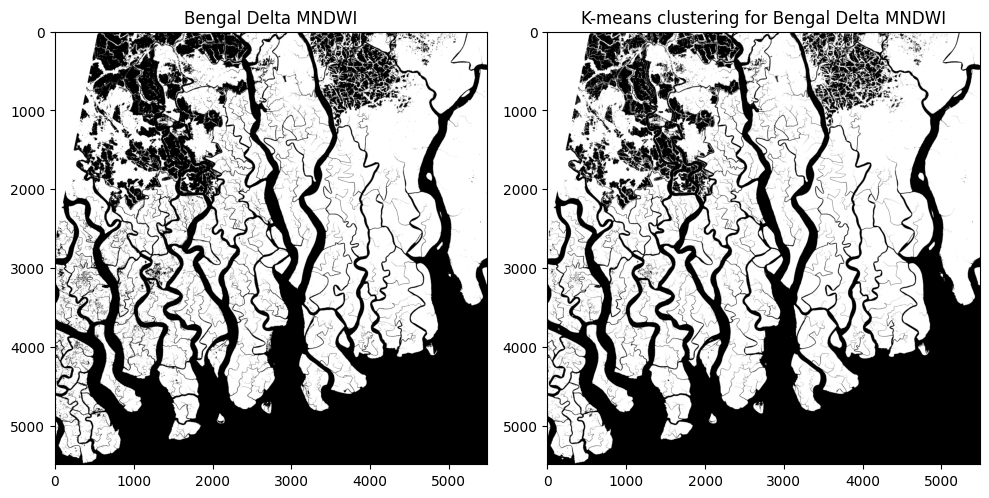

In [ ]:
# Load the saved MNDWI mask from the GeoTIFF file
BD_10_mask_mndwi_path = '/content/drive/MyDrive/GEOL0069/Final/Bangladesh_10/BD_10_mask_mndwi.tif'
with rasterio.open(BD_10_mask_mndwi_path) as src:
    BD_10_mask_mndwi = src.read(1)  # Read the first band

# Plot the MNDWI mask
plt.figure(figsize=(10,5))

plt.subplot(1, 2, 1)
plt.title('Bengal Delta MNDWI')
plt.imshow(BD_10_mask_mndwi, cmap='binary', vmin=0, vmax=1)

plt.subplot(1, 2, 2)
plt.imshow(labels_image_mndwi, cmap='binary', vmin=0, vmax=1)
plt.title('K-means clustering for Bengal Delta MNDWI')

plt.tight_layout()
# plt.savefig("/content/drive/MyDrive/GEOL0069/Final/BD_MNDWI.png")
plt.show()

Classification Report:
               precision    recall  f1-score   support

           0       0.96      1.00      0.98  17165441
           1       1.00      0.94      0.97  12974659

    accuracy                           0.97  30140100
   macro avg       0.98      0.97      0.97  30140100
weighted avg       0.98      0.97      0.97  30140100



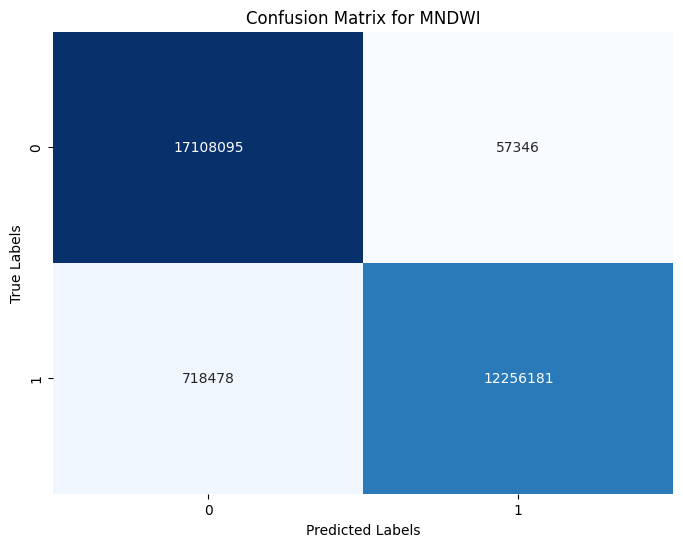

Accuracy: 0.97


In [ ]:
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.metrics import confusion_matrix, accuracy_score, classification_report


# Set threshold
threshold = 0.0

# Calculate the binary mask
BD_10_mask_mndwi = (BD_10_mask_mndwi > threshold).astype(np.uint8)
labels_image_mndwi = (labels_image_mndwi > threshold).astype(np.uint8)

# Flattening mask array
BD_10_mask_mndwi_flat = BD_10_mask_mndwi.flatten()
labels_image_mndwi_flat = labels_image_mndwi.flatten()

# Calculate confusion matrix
cm_mndwi = confusion_matrix(BD_10_mask_mndwi_flat, labels_image_mndwi_flat)

# calculate accuracy
accuracy = accuracy_score(BD_10_mask_mndwi_flat, labels_image_mndwi_flat)

# Display classification report
report = classification_report(BD_10_mask_mndwi_flat, labels_image_mndwi_flat)
print("Classification Report:\n", report)

# Plot confusion matrix
plt.figure(figsize=(8, 6))
sns.heatmap(cm_mndwi, annot=True, fmt="d", cmap="Blues", cbar=False)
plt.title("Confusion Matrix for MNDWI")
plt.xlabel("Predicted Labels")
plt.ylabel("True Labels")
plt.show()

# Print accuracy score
print(f"Accuracy: {accuracy:.2f}")

In [ ]:
end = time.time()
print(f"Total time used: {(end - start)/3600:.3f} hours")

Total time used: 0.147 hours


✅ The generated visualisations are very similar, with an accuracy rate of 97%,  that emphasises the effectiveness of unsupervised learning for correct classification. So far, it has taken a total of 0.147 hour to run.

## 💧 Normalised Difference Water Index (NDWI)
Normalised Difference Water Index (NDWI) is a traditional water extraction formula, especially suitable for clear water and less interfering backgrounds. It relies on the difference between **the green band (B3) and the near-infrared band (B8)**. According to McFeeters in 1996, the formula is:

$$\text{NDWI} = \frac{\text{Green} - \text{NIR}}{\text{Green} + \text{NIR}}.$$
which is
$$\text{NDWI} = \frac{\text{B3} - \text{B8}}{\text{B3} + \text{B8}}.$$

The values of NDWI here:

- NDWI closes to 1: Classified as water.
- NDWI closes to 0: Classified as non-water.

### 🗺️ NDWI Basic Masks

The code below analyses the October and December NDWI of the Bengal Delta using S2 data and generates binary masks of the water bodies. Because the resolution is 10m here, the RAM required to run is much higher than the previous 20m, so the time is divided to ensure that the entire colab file running time can be fully calculated, and in order to facilitate future running, but also to avoid the problem of insufficient RAM, before visualising the image, save the processed data and load the data. Finally, the difference of the masks was analysed by using the confusion matrix to compare the water bodies of two months. During this process, the threshold is set to 0.

In [ ]:
import time
start = time.time()

In [ ]:
import rasterio
import numpy as np

# Specify file paths to the bands being used
BD_10_ndwi_base_paths = {
    'B8': BD_10_base_path + 'R10m/T45QYE_20231028T042901_B08_10m.jp2',  # NIR
    'B3': BD_10_base_path + 'R10m/T45QYE_20231028T042901_B03_10m.jp2',  # Green
}

# Read and stack the band images
BD_10_ndwi_band_data = []
for band in ['B3', 'B8']:
    with rasterio.open(BD_10_ndwi_base_paths[band]) as src:
        BD_10_ndwi_band_data.append(src.read(1))

# Stack bands and create a mask for valid data (non-zero values in all bands)
BD_10_ndwi_band_stack = np.dstack(BD_10_ndwi_band_data)
BD_10_ndwi_valid_data_mask = np.all(BD_10_ndwi_band_stack > 0, axis=2)


# Calculating the NDWI
BD_10_ndwi_green_band = BD_10_ndwi_band_stack[:,:,0].astype(np.float16) # B03
BD_10_ndwi_nir_band = BD_10_ndwi_band_stack[:,:,1].astype(np.float16)   # B08

BD_10_ndwi = (BD_10_ndwi_green_band-BD_10_ndwi_nir_band)/(BD_10_ndwi_green_band+BD_10_ndwi_nir_band)

# Thresholding the NDWI
threshold = 0.0 # Threshold value
BD_10_mask_ndwi = np.where(BD_10_ndwi > threshold, 1, 0).astype(np.uint8)

<ipython-input-42-54f2cb11ce66>:25: RuntimeWarning: invalid value encountered in divide
  BD_10_ndwi = (BD_10_ndwi_green_band-BD_10_ndwi_nir_band)/(BD_10_ndwi_green_band+BD_10_ndwi_nir_band)


In [ ]:
# Save NDWI band stack (Green + NIR)
np.save('/content/drive/MyDrive/GEOL0069/Final/BD_10_ndwi_band_stack.npy', BD_10_ndwi_band_stack)

# Save the valid pixel mask
np.save('/content/drive/MyDrive/GEOL0069/Final/BD_10_ndwi_valid_data_mask.npy', BD_10_ndwi_valid_data_mask)

In [ ]:
import json

# Specify the file path where you want to save the dictionary
json_file_path = '/content/drive/MyDrive/GEOL0069/Final/BD_10_ndwi_base_paths.json'

# Save the dictionary to a JSON file
with open(json_file_path, 'w') as json_file:
    json.dump(BD_10_ndwi_base_paths, json_file, indent=4)


In [ ]:
import rasterio
import numpy as np

# Define the file path to save the NDWI result as GeoTIFF
output_ndwi_file_path = '/content/drive/MyDrive/GEOL0069/Final/BD_10_ndwi.tif'

# Define the metadata for the new raster file based on one of the input bands (e.g., Band 3)
with rasterio.open(BD_10_ndwi_base_paths['B3']) as src:
    meta = src.meta  # Get metadata from one of the source images (e.g., CRS, transform, etc.)

# Update metadata for the new file (1 band, float32 type for NDWI)
meta.update(dtype=rasterio.float32, count=1, driver='GTiff')  # Specify 'GTiff' as the driver for GeoTIFF format

# Save the NDWI array as GeoTIFF
with rasterio.open(output_ndwi_file_path, 'w', **meta) as dst:
    dst.write(BD_10_ndwi.astype(np.float32), 1)  # Write NDWI data to the first band


In [ ]:
import rasterio
import numpy as np

# Define file path to save the NDWI mask
BD_10_mask_ndwi_path = BD_10_base_path +'BD_10_mask_ndwi.tif'

# Save the  mask as a GeoTIFF
with rasterio.open(BD_10_ndwi_base_paths['B3']) as src:  # Read one of the source bands to get metadata
    meta = src.meta  # Get metadata from the source image (e.g., CRS, transform, etc.)

    # Update metadata for the new file (1 band, uint8 type)
    meta.update(dtype=rasterio.uint8, count=1)

    # Save the NDWI mask as GeoTIFF
    with rasterio.open(BD_10_mask_ndwi_path, 'w', **meta) as dst:
        dst.write(BD_10_mask_ndwi, 1)  # Write the NDWI mask to the first band

In [ ]:
import rasterio
import numpy as np

# Specify file paths to the bands being used
BD_12_ndwi_base_paths = {
    'B8': BD_12_base_path + 'R10m/T45QYE_20241231T043201_B08_10m.jp2',  # NIR
    'B3': BD_12_base_path + 'R10m/T45QYE_20241231T043201_B03_10m.jp2',  # Green
}

# Read and stack the band images
BD_12_ndwi_band_data = []
for band in ['B3', 'B8']:
    with rasterio.open(BD_12_ndwi_base_paths[band]) as src:
        BD_12_ndwi_band_data.append(src.read(1))

# Stack bands and create a mask for valid data (non-zero values in all bands)
BD_12_ndwi_band_stack = np.dstack(BD_12_ndwi_band_data)
BD_12_ndwi_valid_data_mask = np.all(BD_12_ndwi_band_stack > 0, axis=2)


# Calculating the NDWI
BD_12_ndwi_green_band = BD_12_ndwi_band_stack[:,:,0].astype(np.float16) # B03
BD_12_ndwi_nir_band = BD_12_ndwi_band_stack[:,:,1].astype(np.float16)   # B08

BD_12_ndwi = (BD_12_ndwi_green_band-BD_12_ndwi_nir_band)/(BD_12_ndwi_green_band+BD_12_ndwi_nir_band)

# Thresholding the NDWI
threshold = 0.0 # Threshold value
BD_12_mask_ndwi = np.where(BD_12_ndwi > threshold, 1, 0).astype(np.uint8)

<ipython-input-47-691b4ae0f6ea>:25: RuntimeWarning: invalid value encountered in divide
  BD_12_ndwi = (BD_12_ndwi_green_band-BD_12_ndwi_nir_band)/(BD_12_ndwi_green_band+BD_12_ndwi_nir_band)


In [ ]:
import rasterio
import numpy as np

# Define file path to save the NDWI mask
BD_12_mask_ndwi_path = BD_12_base_path +'BD_12_mask_ndwi.tif'

# Save the NDWI mask as a GeoTIFF
with rasterio.open(BD_12_ndwi_base_paths['B3']) as src:  # Read one of the source bands to get metadata
    meta = src.meta  # Get metadata from the source image (e.g., CRS, transform, etc.)

    # Update metadata for the new file (1 band, uint8 type)
    meta.update(dtype=rasterio.uint8, count=1)

    # Save the NDWI mask as GeoTIFF
    with rasterio.open(BD_12_mask_ndwi_path, 'w', **meta) as dst:
        dst.write(BD_12_mask_ndwi, 1)  # Write the NDWI mask to the first band

In [ ]:
import rasterio
import matplotlib.pyplot as plt

BD_10_mask_ndwi_path = '/content/drive/MyDrive/GEOL0069/Final/Bangladesh_10/BD_10_mask_ndwi.tif'
BD_12_mask_ndwi_path = '/content/drive/MyDrive/GEOL0069/Final/Bangladesh_12/BD_12_mask_ndwi.tif'

# Load the saved NDWI mask from the GeoTIFF file
with rasterio.open(BD_10_mask_ndwi_path) as src:
    BD_10_mask_ndwi = src.read(1)  # Read the first band

with rasterio.open(BD_12_mask_ndwi_path) as src:
    BD_12_mask_ndwi = src.read(1)  # Read the first band

In [ ]:
end = time.time()
print(f"Total time used: {(end - start)/3600:.3f} hours")

Total time used: 0.051 hours


In [ ]:
import time
start = time.time()

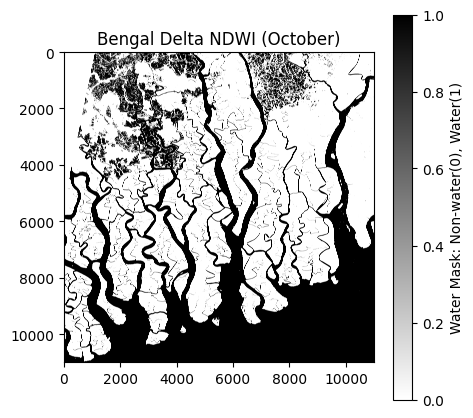

In [ ]:
# Plot the NDWI mask

plt.figure(figsize=(5,5))
plt.title('Bengal Delta NDWI (October)')
plt.imshow(BD_10_mask_ndwi, cmap='binary',vmin=0, vmax=1)
plt.colorbar(label='Water Mask: Non-water(0), Water(1)')

# plt.savefig("/content/drive/MyDrive/GEOL0069/Final/BD_NDWI_10_Mask.png")
plt.show()

plt.close()

In [ ]:
end = time.time()
print(f"Total time used: {(end - start)/3600:.3f} hours")

Total time used: 0.014 hours


In [ ]:
import time
start = time.time()

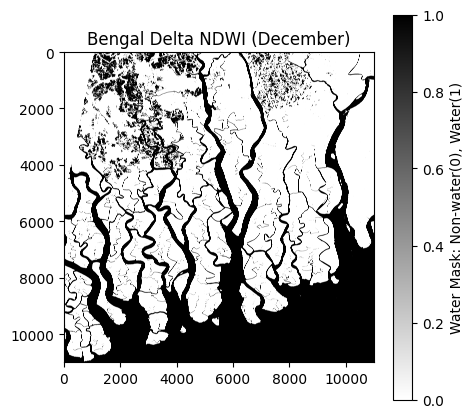

In [ ]:

plt.figure(figsize=(5,5))
plt.title('Bengal Delta NDWI (December)')
plt.imshow(BD_12_mask_ndwi, cmap='binary',vmin=0, vmax=1)
plt.colorbar(label='Water Mask: Non-water(0), Water(1)')

# plt.savefig("/content/drive/MyDrive/GEOL0069/Final/BD_NDWI_12_Mask.png")
plt.show()

plt.close()

Classification Report:
               precision    recall  f1-score   support

           0       0.96      0.99      0.97  74415123
           1       0.98      0.93      0.95  46145277

    accuracy                           0.96 120560400
   macro avg       0.97      0.96      0.96 120560400
weighted avg       0.96      0.96      0.96 120560400



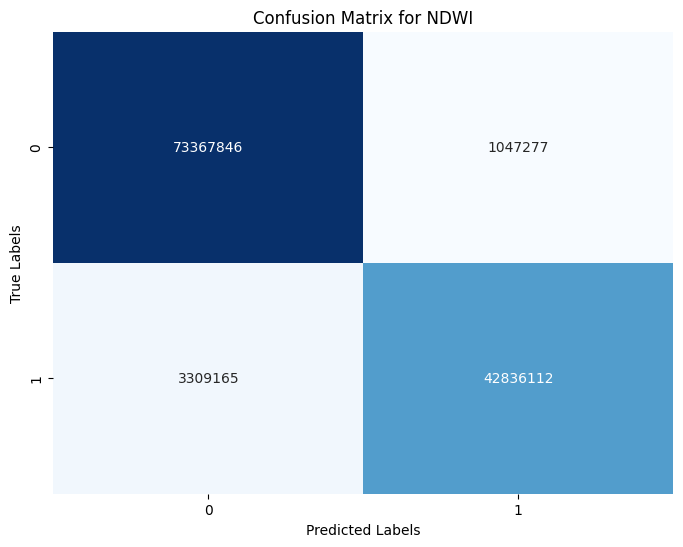

Accuracy: 0.96


In [ ]:
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.metrics import confusion_matrix, accuracy_score, classification_report


# Set threshold
threshold = 0.0

# Calculate the binary mask
BD_10_mask_ndwi = (BD_10_mask_ndwi > threshold).astype(np.uint8)
BD_12_mask_ndwi = (BD_12_mask_ndwi > threshold).astype(np.uint8)

# Flattening mask array
BD_10_mask_ndwi_flat = BD_10_mask_ndwi.flatten()
BD_12_mask_ndwi_flat = BD_12_mask_ndwi.flatten()

# Calculate confusion matrix
cm_ndwi = confusion_matrix(BD_10_mask_ndwi_flat, BD_12_mask_ndwi_flat)

# calculate accuracy
accuracy = accuracy_score(BD_10_mask_ndwi_flat, BD_12_mask_ndwi_flat)

# Display classification report
report = classification_report(BD_10_mask_ndwi_flat, BD_12_mask_ndwi_flat)
print("Classification Report:\n", report)

# Plot confusion matrix
plt.figure(figsize=(8, 6))
sns.heatmap(cm_ndwi, annot=True, fmt="d", cmap="Blues", cbar=False)
plt.title("Confusion Matrix for NDWI")
plt.xlabel("Predicted Labels")
plt.ylabel("True Labels")
plt.show()

# Print accuracy score
print(f"Accuracy: {accuracy:.2f}")


In [ ]:
end = time.time()
print(f"Total time used: {(end - start)/3600:.3f} hours")

Total time used: 0.021 hours


✅ The image presents a detailed distribution of water bodies, it can be seen that the water bodies in December is a fewer than that in October and the accuracy is 96%. The running duration of this part is 0.021 hours.

### 🔧 K-means Clustering Algorithm Based on NDWI
The following code visualises several bands required for calculating NDWI, **Band 3 (Green) and Band 8 (NIR)**, then performs the k-mean operation based on NDWI and visualises the water bodies mask. The k-mean mask based on NDWI data is compared with the basic mask, and the comparison results are displayed using a confusion matrix.

In [ ]:
import time
start = time.time()

In [ ]:
import rasterio
import numpy as np
import matplotlib.pyplot as plt

# Load NDWI band stack (Green + NIR)
BD_10_ndwi_band_stack = np.load('/content/drive/MyDrive/GEOL0069/Final/BD_10_ndwi_band_stack.npy')

# Load the valid pixel mask
BD_10_ndwi_valid_data_mask = np.load('/content/drive/MyDrive/GEOL0069/Final/BD_10_ndwi_valid_data_mask.npy')

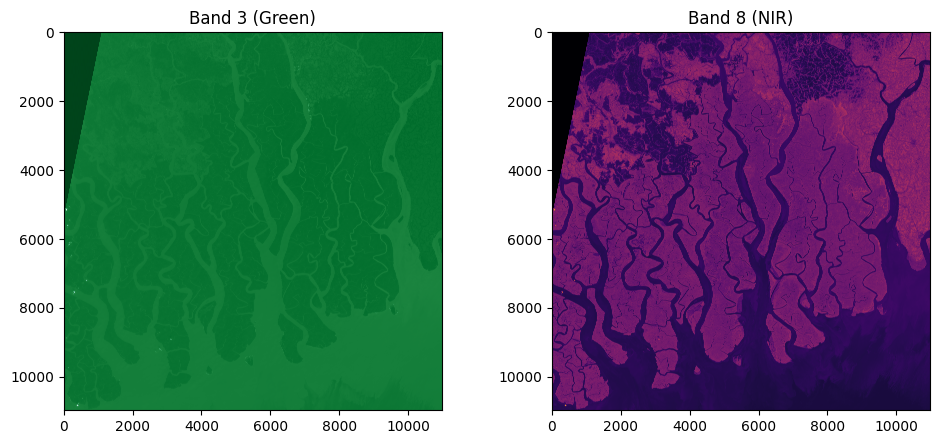

In [ ]:
# Visual representation of bands
fig, (ax1, ax2) = plt.subplots(1, 2)

ax1.imshow(BD_10_ndwi_band_stack[:,:,0], cmap='BuGn_r')  # Plot on the first subplot (ax1)
ax1.set_title('Band 3 (Green)')

ax2.imshow(BD_10_ndwi_band_stack[:,:,1], cmap= 'inferno')  # Plot on the second subplot (ax2)
ax2.set_title('Band 8 (NIR)')


plt.tight_layout()
fig.set_size_inches(10, 5)
plt.show()

In [ ]:
import json

# Load the dictionary from the saved JSON file
json_file_path = '/content/drive/MyDrive/GEOL0069/Final/BD_10_ndwi_base_paths.json'

with open(json_file_path, 'r') as json_file:
    BD_10_ndwi_base_paths = json.load(json_file)


In [ ]:
import rasterio
import numpy as np
from sklearn.cluster import KMeans
import matplotlib.pyplot as plt


BD_10_ndwi_path = '/content/drive/MyDrive/GEOL0069/Final/BD_10_ndwi.tif'

# Load the saved NDWI mask from the GeoTIFF file
with rasterio.open(BD_10_ndwi_path) as src:
    BD_10_ndwi = src.read(1)
    nodata_val = src.nodata

# Reshape for K-means, only including valid data
X_ndwi = BD_10_ndwi[BD_10_ndwi_valid_data_mask].reshape((-1, 1))

# K-means clustering
kmeans = KMeans(n_clusters=2, random_state=0).fit(X_ndwi)
labels = kmeans.labels_

mean_cluster_values = [X_ndwi[labels == i].mean() for i in range(2)]

# Reverse the labels if needed to make sure water is labeled as 1
if mean_cluster_values[0] > mean_cluster_values[1]:
    labels = 1 - labels

# Create an empty array for the result, filled with a no-data value (e.g., -1)
labels_image_ndwi = np.full(BD_10_ndwi_band_stack.shape[:2], -1, dtype=int)

# Place cluster labels in the locations corresponding to valid data
labels_image_ndwi[BD_10_ndwi_valid_data_mask] = labels


In [ ]:
import rasterio
import numpy as np

# Define file path to save the NDWI mask
labels_image_ndwi_path = '/content/drive/MyDrive/GEOL0069/Final/labels_image_ndwi.tif'

# Save the NDWI mask as a GeoTIFF
with rasterio.open(BD_10_ndwi_base_paths['B3']) as src:  # Read one of the source bands to get metadata
    meta = src.meta  # Get metadata from the source image (e.g., CRS, transform, etc.)

    # Update metadata for the new file (1 band, uint8 type)
    meta.update(dtype=rasterio.int16, count=1, nodata=-1)

    # Save the NDWI mask as GeoTIFF
    with rasterio.open(labels_image_ndwi_path, 'w', **meta) as dst:
      dst.write(labels_image_ndwi, 1)  # Write the NDWI mask to the first band

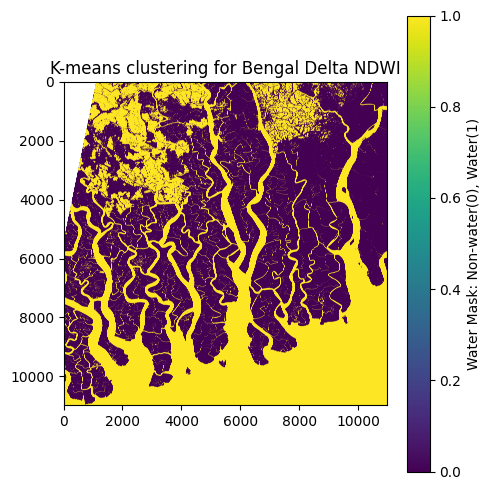

In [ ]:
import rasterio
import matplotlib.pyplot as plt

labels_image_ndwi_path = '/content/drive/MyDrive/GEOL0069/Final/labels_image_ndwi.tif'

# Load the saved NDWI mask from the GeoTIFF file
with rasterio.open(labels_image_ndwi_path) as src:
    labels_image_ndwi = src.read(1)
    nodata_val = src.nodata

# Mask
labels_image_ndwi = np.ma.masked_where(labels_image_ndwi == nodata_val, labels_image_ndwi)

# Plot the NDWI mask
plt.figure(figsize=(5,5))

plt.imshow(labels_image_ndwi, cmap='viridis', vmin=0, vmax=1)
plt.title('K-means clustering for Bengal Delta NDWI')
plt.colorbar(label='Water Mask: Non-water(0), Water(1)')

plt.tight_layout()
#plt.savefig("/content/drive/MyDrive/GEOL0069/Final/BD_NDWI_kmean.png")
plt.show()

In [ ]:
end = time.time()
print(f"Total time used: {(end - start)/3600:.3f} hours")

Total time used: 0.031 hours


In [ ]:
import time
start = time.time()

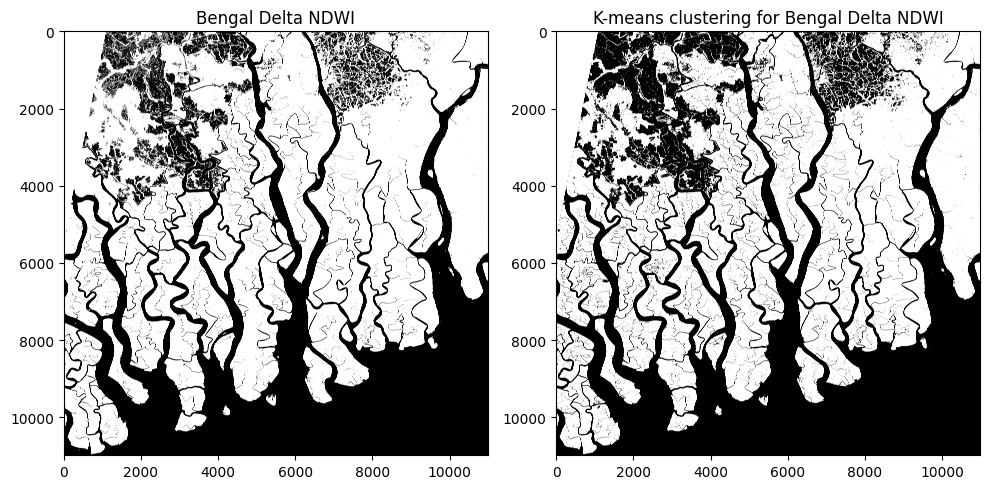

In [ ]:
import rasterio
import matplotlib.pyplot as plt

labels_image_ndwi_path = '/content/drive/MyDrive/GEOL0069/Final/labels_image_ndwi.tif'

# Load the saved NDWI mask from the GeoTIFF file
with rasterio.open(labels_image_ndwi_path) as src:
    labels_image_ndwi = src.read(1)
    nodata_val = src.nodata

# Mask
labels_image_ndwi = np.ma.masked_where(labels_image_ndwi == nodata_val, labels_image_ndwi)


BD_10_mask_ndwi_path = '/content/drive/MyDrive/GEOL0069/Final/Bangladesh_10/BD_10_mask_ndwi.tif'

# Load the saved NDWI mask from the GeoTIFF file
with rasterio.open(BD_10_mask_ndwi_path) as src:
    BD_10_mask_ndwi = src.read(1)  # Read the first band

# Plot the NDWI mask
plt.figure(figsize=(10,5))

plt.subplot(1, 2, 1)
plt.title('Bengal Delta NDWI')
plt.imshow(BD_10_mask_ndwi, cmap='binary', vmin=0, vmax=1)

plt.subplot(1, 2, 2)
plt.imshow(labels_image_ndwi, cmap='binary', vmin=0, vmax=1)
plt.title('K-means clustering for Bengal Delta NDWI')

plt.tight_layout()
#plt.savefig("/content/drive/MyDrive/GEOL0069/Final/BD_NDWI.png")
plt.show()

Classification Report:
               precision    recall  f1-score   support

           0       1.00      0.94      0.97  74415123
           1       0.91      1.00      0.95  46145277

    accuracy                           0.96 120560400
   macro avg       0.95      0.97      0.96 120560400
weighted avg       0.96      0.96      0.96 120560400



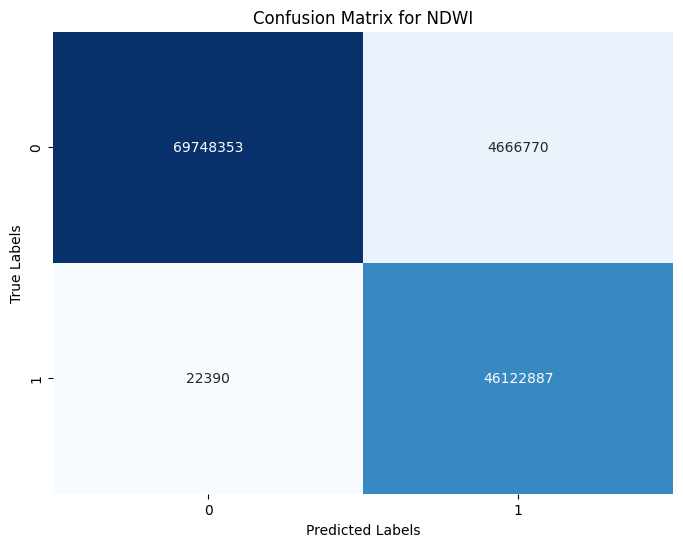

Accuracy: 0.96


In [ ]:
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.metrics import confusion_matrix, accuracy_score, classification_report

# Set threshold
threshold = 0.0

# Ensure that both arrays are numpy arrays and not masked arrays
BD_10_mask_ndwi = np.ma.filled(BD_10_mask_ndwi, 0)  # Convert to normal array, filling masked values with 0
labels_image_ndwi = np.ma.filled(labels_image_ndwi, 0)  # Same here for labels_image_ndwi

# Calculate the binary mask (Ensure both arrays are binary)
BD_10_mask_ndwi = (BD_10_mask_ndwi > threshold).astype(np.uint8)
labels_image_ndwi = (labels_image_ndwi > threshold).astype(np.uint8)

# Flattening mask array
BD_10_mask_ndwi_flat = BD_10_mask_ndwi.flatten()
labels_image_ndwi_flat = labels_image_ndwi.flatten()

# Calculate confusion matrix
cm_ndwi = confusion_matrix(BD_10_mask_ndwi_flat, labels_image_ndwi_flat)

# Calculate accuracy
accuracy = accuracy_score(BD_10_mask_ndwi_flat, labels_image_ndwi_flat)

# Display classification report
report = classification_report(BD_10_mask_ndwi_flat, labels_image_ndwi_flat)
print("Classification Report:\n", report)

# Plot confusion matrix
plt.figure(figsize=(8, 6))
sns.heatmap(cm_ndwi, annot=True, fmt="d", cmap="Blues", cbar=False)
plt.title("Confusion Matrix for NDWI")
plt.xlabel("Predicted Labels")
plt.ylabel("True Labels")
plt.show()

# Print accuracy score
print(f"Accuracy: {accuracy:.2f}")


In [ ]:
end = time.time()
print(f"Total time used: {(end - start)/3600:.3f} hours")

Total time used: 0.051 hours


✅ It can be seen from the generated masks that the result of k-mean based on NDWI is very similar to that of using NDWI along, with an accuracy rate of 96%. There is only a slight difference at the top of masks, which might be caused by sediment. The previous masks using k-mean based on MNDWI is more detailed and has a higher accuracy rate than this mask, which indicates that MNDWI is more effective in analysing areas like the Bengal Delta that contain wetlands and dense vegetation. The running time of this piece of code is 0.051 hours.

# 📍 Mississippi Delta
The dynamic landform subsidence of the Mississippi Delta is caused by the combined impact of human activities on sediment supply and river flow, ground subsidence and sea level rise, posing a significant threat to natural and social systems (Blum & Roberts, 2012; Twilley et al., 2016). Therefore, it is very necessary to conduct an analysis of the distribution of water bodies here.

September is the flood season in the Mississippi Delta. The main reason is that this period is when tropical storms and hurricanes are active. Heavy rain and the rise in river water levels increase the probability of floods. So I chose the same location in September and December as the research object.

Load the base path of the data, which can be changed according to the individual's situation, then the band information is extracted separately according to the band required by different methods. In order to simplify the path, I have extracted the data image that I need to use separately, that the `Mississippi_9/` includes `S2B_MSIL2A_20240913T162829_N0511_R083_T16RBT_20240913T220827.SAFE/GRANULE/L2A_T16RBT_A039291_20240913T163739/IMG_DATA`,
 and the `Mississippi_12/` includes `S2B_MSIL2A_20241222T163619_N0511_R083_T16RBT_20241222T214343.SAFE/GRANULE/L2A_T16RBT_A040721_20241222T163650/IMG_DATA`, you might need the full path if  using directly downloaded files.

Here I am using L2A data, which has been corrected for the atmosphere and more suitable for surface analysis.

## 💧 Automated Water Extraction Index (AWEI)

It combines several bands, including **green band (B3), near-infrared band (B8 or B8A), and two short-wave infrared bands (B11 and B12)**, taking into account the reflection characteristics of different bands on the water body. According to Feyisa in 2014 the usual formula is:

$$\text{AWEI} = {\text{Blue} + 2.5 * \text{Green}} - 1.5 * ({\text{NIR} + \text{SWIR1}}) - 0.25 * {\text{SWIR2}},$$ which is $$\text{AWEI} = {\text{B2} + 2.5 * \text{B3}} - 1.5 * ({\text{B8} + \text{B11}}) - 0.25 * {\text{B12}}.$$

The values of AWEI here:

- AWEI closes to **1**: Classified as water.
- AWEI closes to **0**: Classified as non-water.

###🗺️ AWEI Basic Masks
The following code uses the S2 data to analyse the AWEI of the Mississippi Delta in September and December and generate the binary masks about water bodies. In order to facilitate later running, and to avoid the problem of insufficient RAM, save the processed data and load the data before visualising the image. Finally, using confusion matrix compare the differences between the water bodies analysis masks of the two months. During this process, threshold is set to 0.

In [ ]:
import time
start = time.time()

In [ ]:
# Specify file paths for Mississippi Delta
M_09_base_path = "/content/drive/MyDrive/GEOL0069/Final/Mississippi_9/"
M_12_base_path = "/content/drive/MyDrive/GEOL0069/Final/Mississippi_12/"

In [ ]:
import rasterio
import numpy as np

# Specify file paths to the bands being used
M_09_bands_paths = {
    'B8': M_09_base_path + 'R20m/T16RBT_20240913T162829_B8A_20m.jp2',  # NIR
    'B3': M_09_base_path + 'R20m/T16RBT_20240913T162829_B03_20m.jp2',  # Green
    'B11': M_09_base_path + 'R20m/T16RBT_20240913T162829_B11_20m.jp2',  # SWIR
    'B12': M_09_base_path + 'R20m/T16RBT_20240913T162829_B12_20m.jp2', # SWIR2
    'B2': M_09_base_path + 'R20m/T16RBT_20240913T162829_B02_20m.jp2' # Blue
}
# Read and stack the band images
M_09_band_data = []
for band in ['B3', 'B8', 'B11','B12','B2']:
    with rasterio.open(M_09_bands_paths[band]) as src:
        M_09_band_data.append(src.read(1))


# Stack bands and create a mask for valid data (non-zero values in all bands)
M_09_band_stack = np.dstack(M_09_band_data)
M_09_valid_data_mask = np.all(M_09_band_stack > 0, axis=2)

# Calculating the AWEI
M_09_green_band = M_09_band_stack[:,:,0].astype(np.float16)  # B03
M_09_nir_band = M_09_band_stack[:,:,1].astype(np.float16)    # B08A
M_09_swir_band = M_09_band_stack[:,:,2].astype(np.float16)   # B11
M_09_swir2_band = M_09_band_stack[:,:,3].astype(np.float16)  # B12
M_09_blue_band = M_09_band_stack[:,:,4].astype(np.float16)   # B02

M_09_awei = M_09_blue_band+2.5*M_09_green_band-1.5*(M_09_nir_band+M_09_swir_band)-0.25*M_09_swir2_band


# Thresholding the AWEI
threshold = 0.0 # Threshold value
M_09_mask_awei = np.where(M_09_awei > threshold, 1, 0).astype(np.uint8)


<ipython-input-3-f5451d018207>:30: RuntimeWarning: overflow encountered in add
  M_09_awei = M_09_blue_band+2.5*M_09_green_band-1.5*(M_09_nir_band+M_09_swir_band)-0.25*M_09_swir2_band


In [ ]:
import rasterio
import numpy as np

# Define file path to save the AWEI mask
M_09_mask_awei_path = M_09_base_path +'M_09_mask_awei.tif'

# Save the AWEI mask as a GeoTIFF
with rasterio.open(M_09_bands_paths['B3']) as src:  # Read one of the source bands to get metadata
    meta = src.meta  # Get metadata from the source image (e.g., CRS, transform, etc.)

    # Update metadata for the new file (1 band, uint8 type)
    meta.update(dtype=rasterio.uint8, count=1)

    # Save the AWEI mask as GeoTIFF
    with rasterio.open(M_09_mask_awei_path, 'w', **meta) as dst:
        dst.write(M_09_mask_awei, 1)  # Write the AWEI mask to the first band


In [ ]:
import rasterio
import numpy as np

# Specify file paths to the bands being used
M_12_bands_paths = {
    'B8': M_12_base_path + 'R20m/T16RBT_20241222T163619_B8A_20m.jp2',  # NIR
    'B3': M_12_base_path + 'R20m/T16RBT_20241222T163619_B03_20m.jp2',  # Green
    'B11': M_12_base_path + 'R20m/T16RBT_20241222T163619_B11_20m.jp2',  # SWIR
    'B12': M_12_base_path + 'R20m/T16RBT_20241222T163619_B12_20m.jp2', # SWIR2
    'B2': M_12_base_path + 'R20m/T16RBT_20241222T163619_B02_20m.jp2' # Blue
}
# Read and stack the band images
M_12_band_data = []
for band in ['B3', 'B8', 'B11','B12', 'B2']:
    with rasterio.open(M_12_bands_paths[band]) as src:
        M_12_band_data.append(src.read(1))


# Stack bands and create a mask for valid data (non-zero values in all bands)
M_12_band_stack = np.dstack(M_12_band_data)
M_12_valid_data_mask = np.all(M_12_band_stack > 0, axis=2)

# Calculating the AWEI
M_12_green_band = M_12_band_stack[:,:,0].astype(np.float16)  # B03
M_12_nir_band = M_12_band_stack[:,:,1].astype(np.float16)    # B08A
M_12_swir_band = M_12_band_stack[:,:,2].astype(np.float16)   # B11
M_12_swir2_band = M_12_band_stack[:,:,3].astype(np.float16)  # B12
M_12_blue_band = M_12_band_stack[:,:,4].astype(np.float16)   # B02

M_12_awei = M_12_blue_band+2.5*M_12_green_band-1.5*(M_12_nir_band+M_12_swir_band)-0.25*M_12_swir2_band

# Thresholding the AWEI
threshold = 0.0 # Threshold value
M_12_mask_awei = np.where(M_12_awei > threshold, 1, 0).astype(np.uint8)

In [ ]:
import rasterio
import numpy as np

# Define file path to save the AWEI mask
M_12_mask_awei_path =M_12_base_path +'M_12_mask_awei.tif'

# Save the AWEI mask as a GeoTIFF
with rasterio.open(M_12_bands_paths['B3']) as src:  # Read one of the source bands to get metadata
    meta = src.meta  # Get metadata from the source image (e.g., CRS, transform, etc.)

    # Update metadata for the new file (1 band, uint8 type)
    meta.update(dtype=rasterio.uint8, count=1)

    # Save the AWEI mask as GeoTIFF
    with rasterio.open(M_12_mask_awei_path, 'w', **meta) as dst:
        dst.write(M_12_mask_awei, 1)  # Write the AWEI mask to the first band

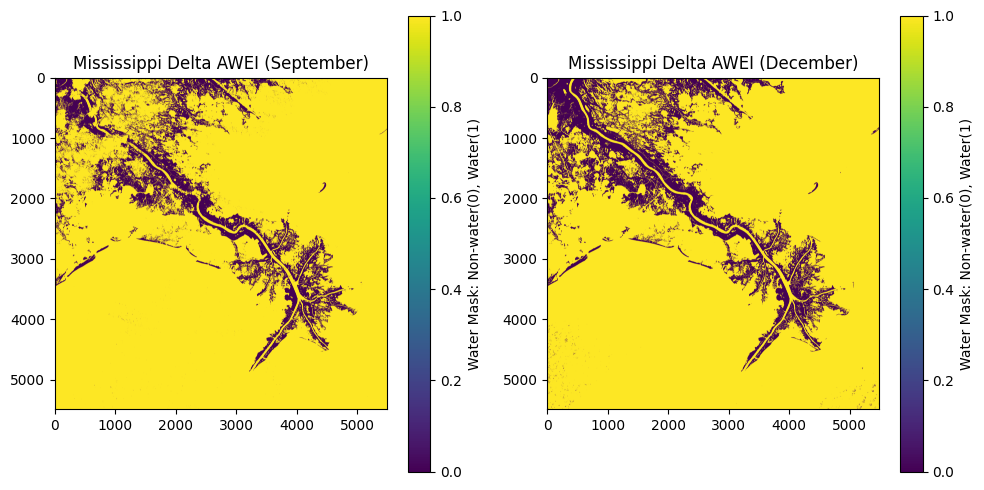

In [ ]:
import rasterio
import matplotlib.pyplot as plt

M_09_mask_awei_path = '/content/drive/MyDrive/GEOL0069/Final/Mississippi_9/M_09_mask_awei.tif'
M_12_mask_awei_path = '/content/drive/MyDrive/GEOL0069/Final/Mississippi_12/M_12_mask_awei.tif'

# Load the saved AWEI mask from the GeoTIFF file
with rasterio.open(M_09_mask_awei_path) as src:
    M_09_mask_awei = src.read(1)  # Read the first band

with rasterio.open(M_12_mask_awei_path) as src:
    M_12_mask_awei = src.read(1)  # Read the first band

# Plot the AWEI mask
plt.figure(figsize=(10,5))

plt.subplot(1, 2, 1)
plt.title('Mississippi Delta AWEI (September)')
plt.imshow(M_09_mask_awei, cmap='viridis', vmin=0, vmax=1)
plt.colorbar(label='Water Mask: Non-water(0), Water(1)')

plt.subplot(1, 2, 2)
plt.title('Mississippi Delta AWEI (December)')
plt.imshow(M_12_mask_awei, cmap='viridis', vmin=0, vmax=1)
plt.colorbar(label='Water Mask: Non-water(0), Water(1)')

plt.tight_layout()
# plt.savefig("/content/drive/MyDrive/GEOL0069/Final/M_AWEI_Mask_threshold_0.4.png")
plt.show()

plt.close()

Classification Report:
               precision    recall  f1-score   support

           0       0.78      0.93      0.85   3782284
           1       0.99      0.96      0.98  26357816

    accuracy                           0.96  30140100
   macro avg       0.89      0.95      0.91  30140100
weighted avg       0.96      0.96      0.96  30140100



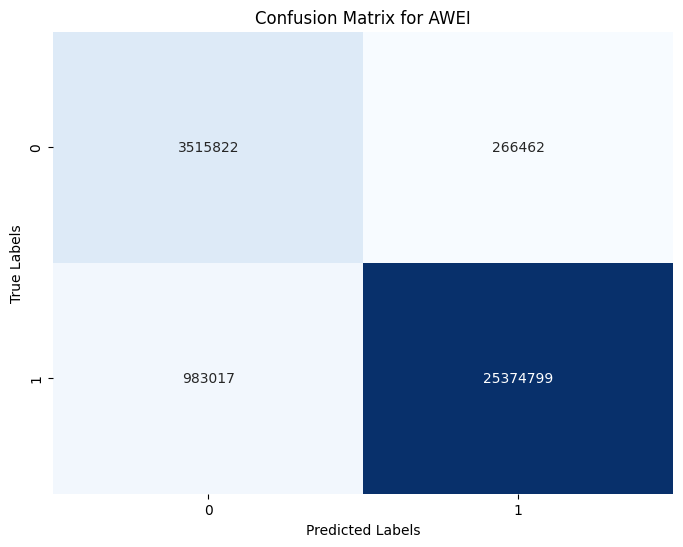

Accuracy: 0.96


In [ ]:
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.metrics import confusion_matrix, accuracy_score, classification_report


# Set threshold
threshold = 0.0

# Calculate the binary mask
M_09_mask_awei = (M_09_mask_awei > threshold).astype(np.uint8)
M_12_mask_awei = (M_12_mask_awei > threshold).astype(np.uint8)

# Flattening mask array
M_09_mask_awei_flat = M_09_mask_awei.flatten()
M_12_mask_awei_flat = M_12_mask_awei.flatten()

# Calculate confusion matrix
cm_awei = confusion_matrix(M_09_mask_awei_flat, M_12_mask_awei_flat)

# Calculate accuracy
accuracy = accuracy_score(M_09_mask_awei_flat, M_12_mask_awei_flat)

# display classification report
report = classification_report(M_09_mask_awei_flat, M_12_mask_awei_flat)
print("Classification Report:\n", report)

# Plot confusion matrix
plt.figure(figsize=(8, 6))
sns.heatmap(cm_awei, annot=True, fmt="d", cmap="Blues", cbar=False)
plt.title("Confusion Matrix for AWEI")
plt.xlabel("Predicted Labels")
plt.ylabel("True Labels")
plt.show()

# Print accuracy score
print(f"Accuracy: {accuracy:.2f}")

✅ The masks are very similar. There is a lack of information in the upper left corner of the September mask, which might be caused by the occlusion of clouds. This also indicates that the weather (such as clouds and rain) can affect the collection and resolution of S2 data. According to the report, the accuracy rate is as high as 96%, which means that there is not much difference in the water bodies of the Mississippi Delta between the two time periods.

###🔧 K-means Clustering Algorithm Based on AWEI

The following code first visualises several bands required by AWEI, **Band 2 (Blue), Band 3 (Green), Band 8 (NIR), Band 11 (SWIR1) and Band 12 (SWIR2)**, then performs k-mean algorithm and visualises the results, compares the k-mean mask based on AWEI data with the basic mask, and generates the comparation results with confusion matrix.

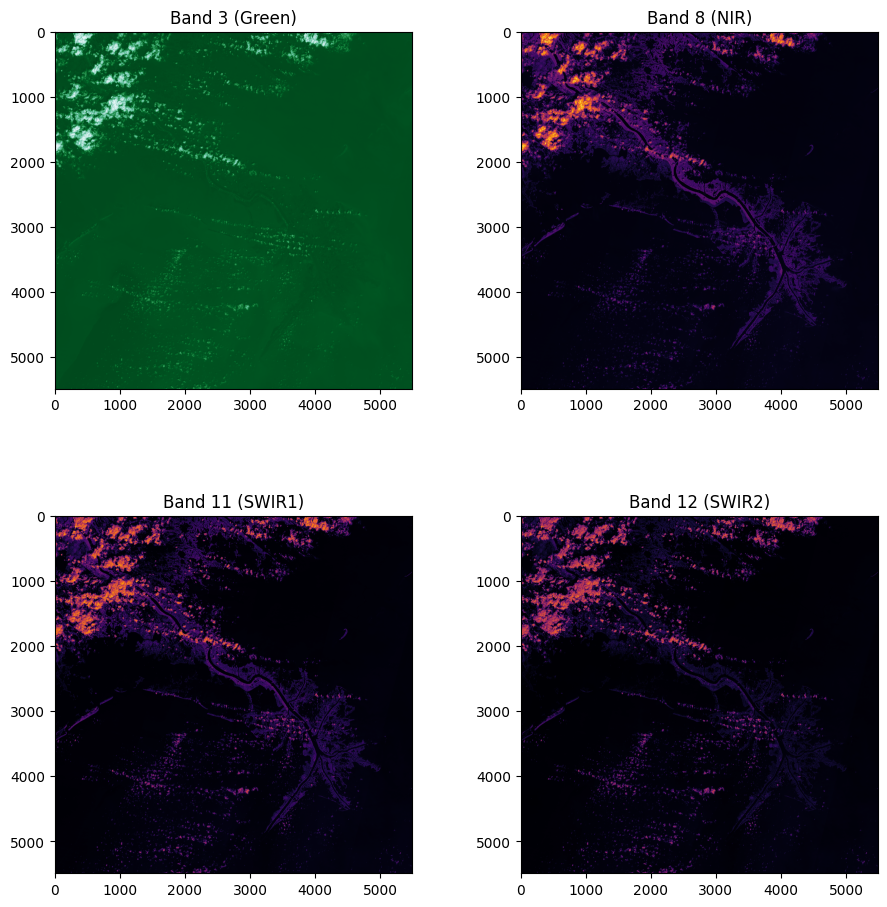

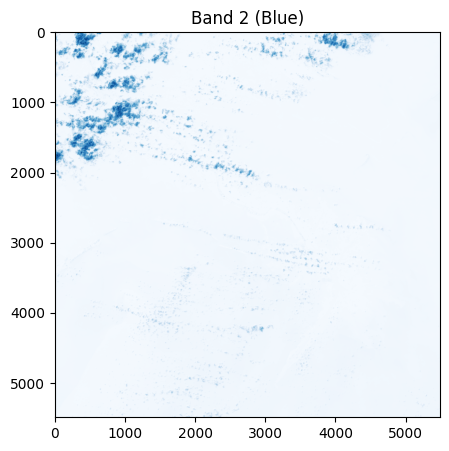

In [ ]:
import rasterio
import matplotlib.pyplot as plt

# Visual representation of bands
fig, axs = plt.subplots(2, 2)
ax1, ax2, ax3, ax4 = axs.ravel()

ax1.imshow(M_09_band_stack[:,:,0], cmap='BuGn_r')  # Plot on the first subplot (ax1)
ax1.set_title('Band 3 (Green)')

ax2.imshow(M_09_band_stack[:,:,1], cmap= 'inferno')  # Plot on the second subplot (ax2)
ax2.set_title('Band 8 (NIR)')


ax3.imshow(M_09_band_stack[:,:,2], cmap= 'inferno')  # Plot on the third subplot (ax3)
ax3.set_title('Band 11 (SWIR1)')

ax4.imshow(M_09_band_stack[:,:,3], cmap= 'inferno')  # Plot on the third subplot (ax3)
ax4.set_title('Band 12 (SWIR2)')

plt.tight_layout()
fig.set_size_inches(10, 10)
plt.show()

plt.figure(figsize=(5,5))
plt.title('Band 2 (Blue)')
plt.imshow(M_09_band_stack[:,:,4], cmap='Blues')
plt.show()



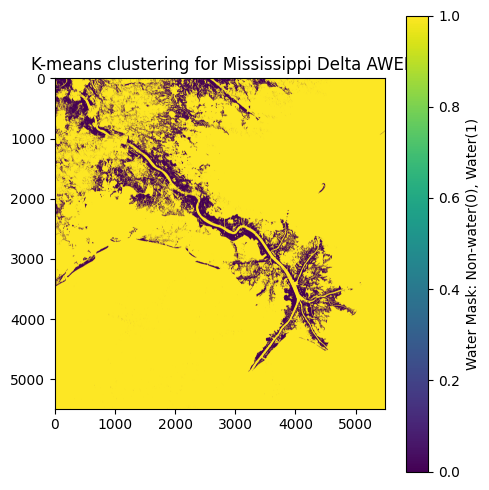

In [ ]:
import rasterio
import numpy as np
from sklearn.cluster import KMeans
import matplotlib.pyplot as plt

M_09_awei_cleaned = np.nan_to_num(M_09_awei, nan=0.0, posinf=0.0, neginf=0.0)
# Reshape for K-means, only including valid data
X_awei = M_09_awei_cleaned[M_09_valid_data_mask].reshape((-1, 1))

# K-means clustering
kmeans = KMeans(n_clusters=2, random_state=0).fit(X_awei)
labels = kmeans.labels_

mean_cluster_values = [X_awei[labels == i].mean() for i in range(2)]
if mean_cluster_values[0] > mean_cluster_values[1]:
    labels = 1 - labels

# Create an empty array for the result, filled with a no-data value (e.g., -1)
labels_image_awei = np.full(M_09_band_stack.shape[:2], -1, dtype=int)

# Place cluster labels in the locations corresponding to valid data
labels_image_awei[M_09_valid_data_mask] = labels


# Plot the AWEI mask
plt.figure(figsize=(5,5))

plt.imshow(labels_image_awei, cmap='viridis')
plt.title('K-means clustering for Mississippi Delta AWEI')
plt.colorbar(label='Water Mask: Non-water(0), Water(1)')

plt.tight_layout()
#plt.savefig("/content/drive/MyDrive/GEOL0069/Final/M_AWEI_kmean.png")
plt.show()

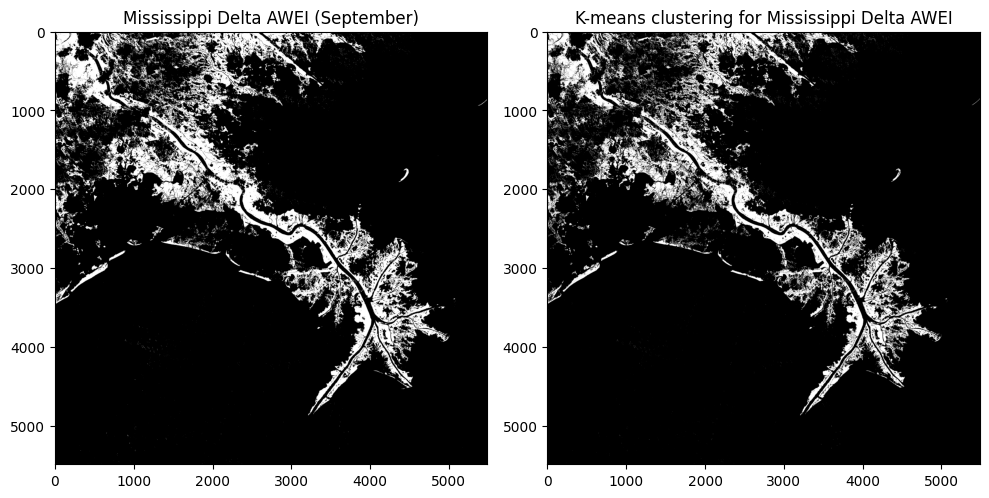

In [ ]:
# Load the saved AWEI mask from the GeoTIFF file
M_09_mask_awei_path = '/content/drive/MyDrive/GEOL0069/Final/Mississippi_9/M_09_mask_awei.tif'
with rasterio.open(M_09_mask_awei_path) as src:
    M_09_mask_awei = src.read(1)  # Read the first band

# Plot the AWEI mask
plt.figure(figsize=(10,5))

plt.subplot(1, 2, 1)
plt.title('Mississippi Delta AWEI (September)')
plt.imshow(M_09_mask_awei, cmap='binary',vmin=0, vmax=1)

plt.subplot(1, 2, 2)
plt.imshow(labels_image_awei, cmap='binary', vmin=0, vmax=1)
plt.title('K-means clustering for Mississippi Delta AWEI')

plt.tight_layout()
# plt.savefig("/content/drive/MyDrive/GEOL0069/Final/M_AWEI.png")
plt.show()

Classification Report:
               precision    recall  f1-score   support

           0       0.97      0.84      0.90   3782284
           1       0.98      1.00      0.99  26357816

    accuracy                           0.98  30140100
   macro avg       0.97      0.92      0.94  30140100
weighted avg       0.98      0.98      0.98  30140100



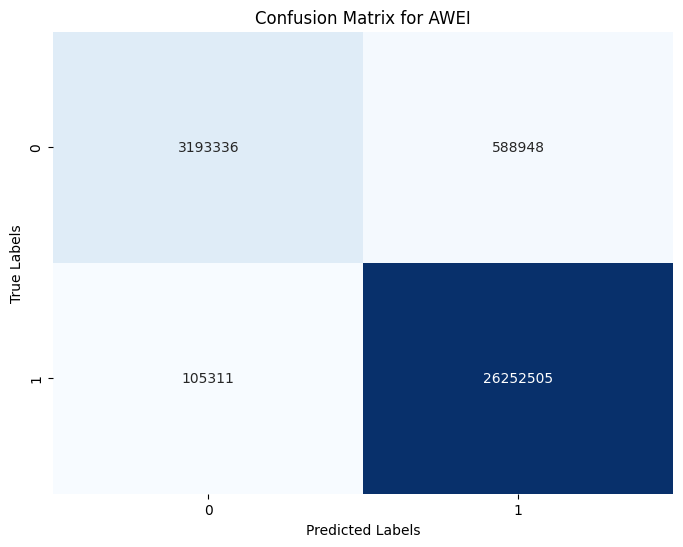

Accuracy: 0.98


In [ ]:
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.metrics import confusion_matrix, accuracy_score, classification_report


# Calculate the binary mask
M_awei = (M_09_mask_awei > threshold).astype(np.uint8)
M_awei_kmean = (labels_image_awei > threshold).astype(np.uint8)

# Flattening mask array
M_awei_flat = M_awei.flatten()
M_awei_kmean_flat = labels_image_awei.flatten()

# Calculate confusion matrix
cm_awei = confusion_matrix(M_awei_flat, M_awei_kmean_flat )

# Calculate accuracy
accuracy = accuracy_score(M_awei_flat, M_awei_kmean_flat )

# display classification report
report = classification_report(M_awei_flat, M_awei_kmean_flat )
print("Classification Report:\n", report)

# Plot confusion matrix
plt.figure(figsize=(8, 6))
sns.heatmap(cm_awei, annot=True, fmt="d", cmap="Blues", cbar=False)
plt.title("Confusion Matrix for AWEI")
plt.xlabel("Predicted Labels")
plt.ylabel("True Labels")
plt.show()

# Print accuracy score
print(f"Accuracy: {accuracy:.2f}")

✅ It can be seen from the masks that the water body distribution in the middle part of the mask after using the k-mean algorithm is more detailed than that of the basic mask, which also emphasises the accuracy of the unsupervised learning algorithm. In addition, the accuracy rates of the two masks are as high as 98%, which indicates that the method combining k-mean and water body index can effectively improve the lassification ability.

## 💧 Modified Normalised Difference Water Index (MNDWI)

As before, it relies on the difference between **the green band (B3) and the short-wave infrared band (B11)**. The formular is

$$\text{MNDWI} = \frac{\text{Green} - \text{SWIR1}}{\text{Green} + \text{SWIR1}}.$$
Which is
$$\text{MNDWI} = \frac{\text{B3} - \text{B11}}{\text{B3} + \text{B11}}.$$

The values of MNDWI here:
- MNDWI closes to **1**: Classified as **water**
- MNDWI closes to **0**: Classified as **non-water**

### 🗺️ MNDWI Basic Masks
The code below analyses the September and December MNDWI of the Mississippi Delta using S2 data and generates a binary mask of the water bodies. And then analysis the difference of the masks by using the confusion matrix to compare the water bodies of two months. During this process, the threshold is set to 0.

In [ ]:
import rasterio
import matplotlib.pyplot as plt

# Calculate MNDWI
M_09_mndwi = (M_09_green_band - M_09_swir_band) / (M_09_green_band + M_09_swir_band + 1e-6)  # Adding epsilon to avoid division by zero

# Thresholding the MNDWI
threshold = 0.0 # Threshold value
M_09_mask_mndwi = np.where(M_09_mndwi > threshold, 1, 0).astype(np.uint8)


In [ ]:
import rasterio
import numpy as np

# Define file path to save the MNDWI mask
M_09_mask_mndwi_path = M_09_base_path +'M_09_mask_mndwi.tif'

# Save the MNDWI mask as a GeoTIFF
with rasterio.open(M_09_bands_paths['B3']) as src:  # Read one of the source bands to get metadata
    meta = src.meta  # Get metadata from the source image (e.g., CRS, transform, etc.)

    # Update metadata for the new file (1 band, uint8 type)
    meta.update(dtype=rasterio.uint8, count=1)

    # Save the MNDWI mask as GeoTIFF
    with rasterio.open(M_09_mask_mndwi_path, 'w', **meta) as dst:
        dst.write(M_09_mask_mndwi, 1)  # Write the MNDWI mask to the first band

In [ ]:
# Calculate MNDWI
M_12_mndwi = (M_12_green_band - M_12_swir_band) / (M_12_green_band + M_12_swir_band + 1e-6)  # Adding epsilon to avoid division by zero

# Thresholding the MNDWI
threshold = 0.0 # Threshold value
M_12_mask_mndwi = np.where(M_12_mndwi > threshold, 1, 0).astype(np.uint8)

In [ ]:
import rasterio
import numpy as np

# Define file path to save the MNDWI mask
M_12_mask_mndwi_path = M_12_base_path +'M_12_mask_mndwi.tif'

# Save the MNDWI mask as a GeoTIFF
with rasterio.open(M_12_bands_paths['B3']) as src:  # Read one of the source bands to get metadata
    meta = src.meta  # Get metadata from the source image (e.g., CRS, transform, etc.)

    # Update metadata for the new file (1 band, uint8 type)
    meta.update(dtype=rasterio.uint8, count=1)

    # Save the MNDWI mask as GeoTIFF
    with rasterio.open(M_12_mask_mndwi_path, 'w', **meta) as dst:
        dst.write(M_12_mask_mndwi, 1)  # Write the MNDWI mask to the first band

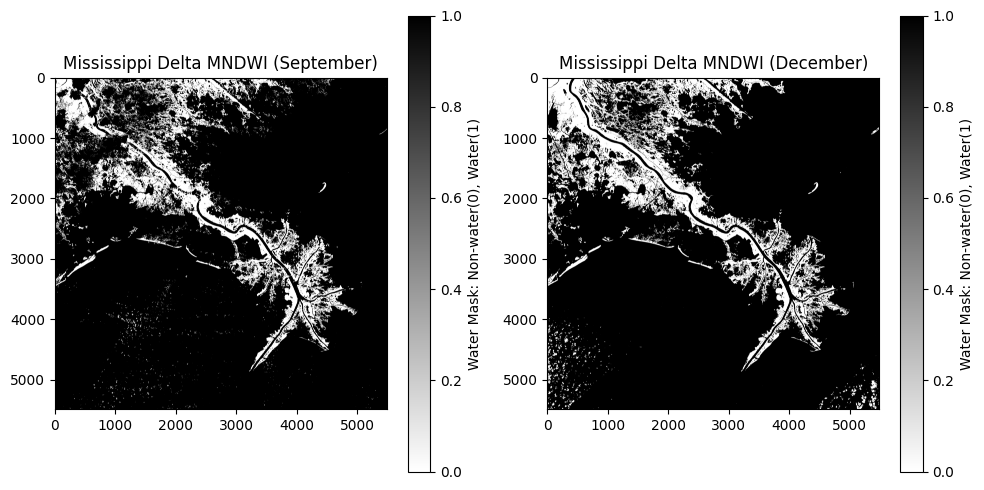

In [ ]:
import rasterio
import matplotlib.pyplot as plt

M_09_mask_mndwi_path = '/content/drive/MyDrive/GEOL0069/Final/Mississippi_9/M_09_mask_mndwi.tif'
M_12_mask_mndwi_path = '/content/drive/MyDrive/GEOL0069/Final/Mississippi_12/M_12_mask_mndwi.tif'

# Load the saved MNDWI mask from the GeoTIFF file
with rasterio.open(M_09_mask_mndwi_path) as src:
    M_09_mask_mndwi = src.read(1)  # Read the first band

with rasterio.open(M_12_mask_mndwi_path) as src:
    M_12_mask_mndwi = src.read(1)  # Read the first band

# Plot the MNDWI mask
plt.figure(figsize=(10,5))

plt.subplot(1, 2, 1)
plt.title('Mississippi Delta MNDWI (September)')
plt.imshow(M_09_mask_mndwi, cmap='binary', vmin=0, vmax=1)
plt.colorbar(label='Water Mask: Non-water(0), Water(1)')

plt.subplot(1, 2, 2)
plt.title('Mississippi Delta MNDWI (December)')
plt.imshow(M_12_mask_mndwi, cmap='binary', vmin=0, vmax=1)
plt.colorbar(label='Water Mask: Non-water(0), Water(1)')

plt.tight_layout()
# plt.savefig("/content/drive/MyDrive/GEOL0069/Final/M_MNDWI_Mask.png")
plt.show()

plt.close()

Classification Report:
               precision    recall  f1-score   support

           0       0.77      0.90      0.83   3980852
           1       0.98      0.96      0.97  26159248

    accuracy                           0.95  30140100
   macro avg       0.87      0.93      0.90  30140100
weighted avg       0.95      0.95      0.95  30140100



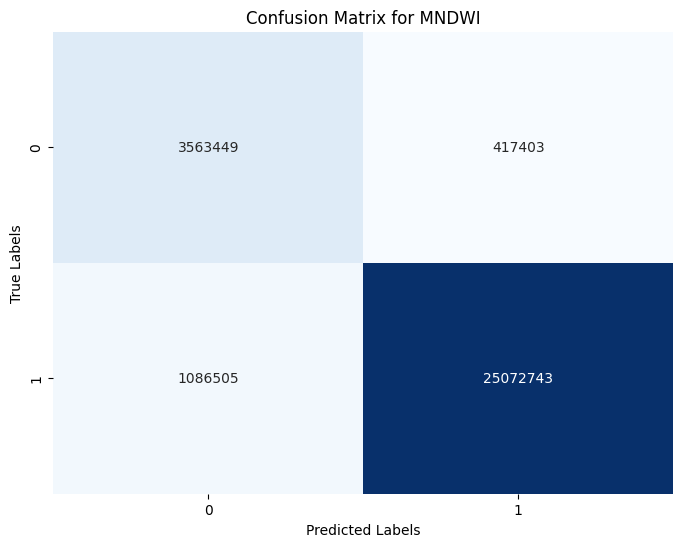

Accuracy: 0.95


In [ ]:
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.metrics import confusion_matrix, accuracy_score, classification_report


# Set threshold
threshold = 0.0

# Calculate the binary mask
M_09_mask_mndwi = (M_09_mask_mndwi > threshold).astype(np.uint8)
M_12_mask_mndwi = (M_12_mask_mndwi > threshold).astype(np.uint8)

# Flattening mask array
M_09_mask_mndwi_flat = M_09_mask_mndwi.flatten()
M_12_mask_mndwi_flat = M_12_mask_mndwi.flatten()

# Calculate confusion matrix
cm_mndwi = confusion_matrix(M_09_mask_mndwi_flat, M_12_mask_mndwi_flat)

# calculate accuracy
accuracy = accuracy_score(M_09_mask_mndwi_flat, M_12_mask_mndwi_flat)

# Display classification report
report = classification_report(M_09_mask_mndwi_flat, M_12_mask_mndwi_flat)
print("Classification Report:\n", report)

# Plot confusion matrix
plt.figure(figsize=(8, 6))
sns.heatmap(cm_mndwi, annot=True, fmt="d", cmap="Blues", cbar=False)
plt.title("Confusion Matrix for MNDWI")
plt.xlabel("Predicted Labels")
plt.ylabel("True Labels")
plt.show()

# Print accuracy score
print(f"Accuracy: {accuracy:.2f}")

✅ As the shown in the masks, the water body distribution in September is slightly more than that in December, but the difference is not very significant. And confusion matrix also presents a high accuracy rate, 95%.

### 🔧 K-means Clustering Algorithm Based on MNDWI
The following code visualises several bands needed to compute MNDWI, **Band 3 (Green) and Band 11 (SWIR1)**, then performs MNDWI-based k-mean Algorithm and visualises the results, compares the MNDWI data-based k-mean mask and the basic mask, and generates a comparison with a confusion matrix.

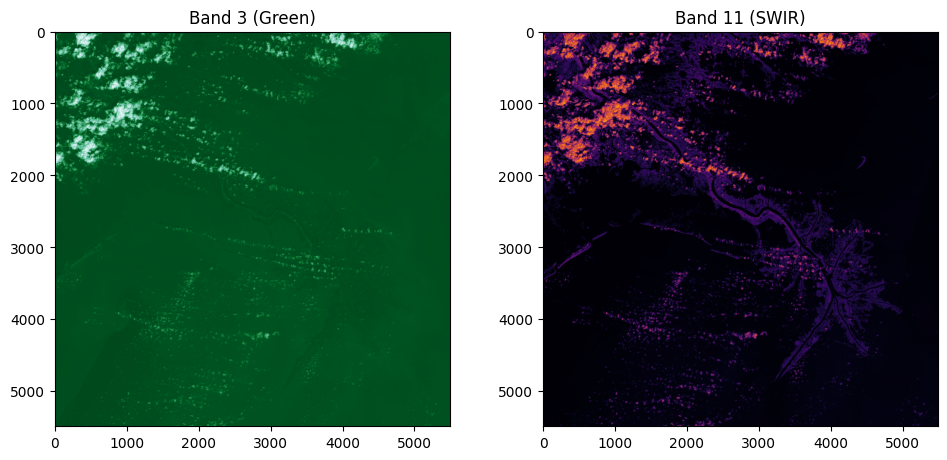

In [ ]:
import rasterio
import matplotlib.pyplot as plt

# Visual representation of bands
fig, (ax1, ax2) = plt.subplots(1, 2)

ax1.imshow(M_09_band_stack[:,:,0], cmap='BuGn_r')  # Plot on the first subplot (ax1)
ax1.set_title('Band 3 (Green)')

ax2.imshow(M_09_band_stack[:,:,2], cmap= 'inferno')  # Plot on the second subplot (ax2)
ax2.set_title('Band 11 (SWIR)')


plt.tight_layout()
fig.set_size_inches(10, 5)
plt.show()

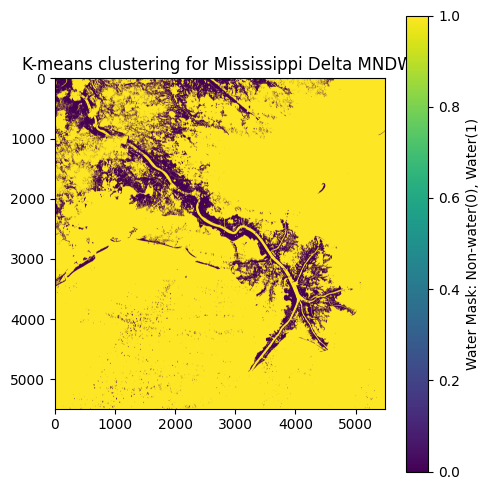

In [ ]:
import rasterio
import numpy as np
from sklearn.cluster import KMeans
import matplotlib.pyplot as plt

# Reshape for K-means, only including valid data
X_mndwi = M_09_mndwi[M_09_valid_data_mask].reshape((-1, 1))

# K-means clustering
kmeans = KMeans(n_clusters=2, random_state=0).fit(X_mndwi)
labels = kmeans.labels_

mean_cluster_values = [X_mndwi[labels == i].mean() for i in range(2)]
if mean_cluster_values[0] > mean_cluster_values[1]:
    labels = 1 - labels

# Create an empty array for the result, filled with a no-data value (e.g., -1)
labels_image_mndwi = np.full(M_09_band_stack.shape[:2], -1, dtype=int)

# Place cluster labels in the locations corresponding to valid data
labels_image_mndwi[M_09_valid_data_mask] = labels


# Plot the MNDWI mask
plt.figure(figsize=(5,5))

plt.imshow(labels_image_mndwi, cmap='viridis')
plt.title('K-means clustering for Mississippi Delta MNDWI')
plt.colorbar(label='Water Mask: Non-water(0), Water(1)')

plt.tight_layout()
# plt.savefig("/content/drive/MyDrive/GEOL0069/Final/M_MNDWI_kmean.png")
plt.show()

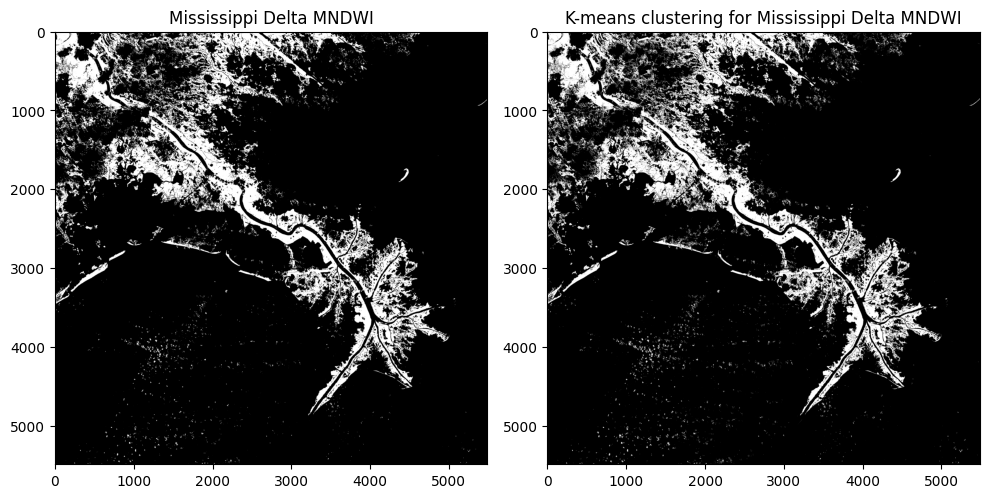

In [ ]:
# Load the saved MNDWI mask from the GeoTIFF file
M_09_mask_mndwi_path = '/content/drive/MyDrive/GEOL0069/Final/Mississippi_9/M_09_mask_mndwi.tif'
with rasterio.open(M_09_mask_mndwi_path) as src:
    M_09_mask_mndwi = src.read(1)  # Read the first band

# Plot the MNDWI mask
plt.figure(figsize=(10,5))

plt.subplot(1, 2, 1)
plt.title('Mississippi Delta MNDWI')
plt.imshow(M_09_mask_mndwi, cmap='binary', vmin=0, vmax=1)

plt.subplot(1, 2, 2)
plt.imshow(labels_image_mndwi, cmap='binary', vmin=0, vmax=1)
plt.title('K-means clustering for Mississippi Delta MNDWI')

plt.tight_layout()
# plt.savefig("/content/drive/MyDrive/GEOL0069/Final/M_MNDWI.png")
plt.show()


Classification Report:
               precision    recall  f1-score   support

           0       0.92      0.95      0.94   3980852
           1       0.99      0.99      0.99  26159248

    accuracy                           0.98  30140100
   macro avg       0.96      0.97      0.96  30140100
weighted avg       0.98      0.98      0.98  30140100



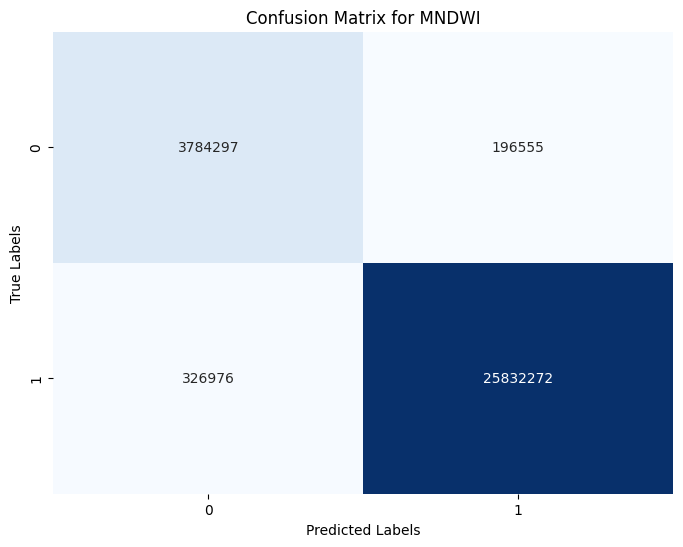

Accuracy: 0.98


In [ ]:
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.metrics import confusion_matrix, accuracy_score, classification_report


# Set threshold
threshold = 0.0

# Calculate the binary mask
M_09_mask_mndwi = (M_09_mask_mndwi > threshold).astype(np.uint8)
labels_image_mndwi = (labels_image_mndwi > threshold).astype(np.uint8)

# Flattening mask array
M_09_mask_mndwi_flat = M_09_mask_mndwi.flatten()
labels_image_mndwi_flat = labels_image_mndwi.flatten()

# Calculate confusion matrix
cm_mndwi = confusion_matrix(M_09_mask_mndwi_flat, labels_image_mndwi_flat)

# calculate accuracy
accuracy = accuracy_score(M_09_mask_mndwi_flat, labels_image_mndwi_flat)

# Display classification report
report = classification_report(M_09_mask_mndwi_flat, labels_image_mndwi_flat)
print("Classification Report:\n", report)

# Plot confusion matrix
plt.figure(figsize=(8, 6))
sns.heatmap(cm_mndwi, annot=True, fmt="d", cmap="Blues", cbar=False)
plt.title("Confusion Matrix for MNDWI")
plt.xlabel("Predicted Labels")
plt.ylabel("True Labels")
plt.show()

# Print accuracy score
print(f"Accuracy: {accuracy:.2f}")

In [ ]:
end = time.time()
print(f"Total time used: {(end - start)/3600:.3f} hours")

Total time used: 0.076 hours


✅ The generated visualisations are very similar, with an accuracy rate of 98%, which emphasises the accuracy of the k-mean algorithm. It has taken 0.076 hour to run this part.

## 💧 Normalised Difference Water Index (NDWI)
As before, using **the green band (B3) and the near-infrared band (B8)** to calculate the NDWI in Mississippi Delta. The formula is:

$$\text{NDWI} = \frac{\text{Green} - \text{NIR}}{\text{Green} + \text{NIR}}.$$
which is
$$\text{NDWI} = \frac{\text{B3} - \text{B8}}{\text{B3} + \text{B8}}.$$

The values of NDWI here:

- NDWI closes to **1**: Classified as water.
- NDWI closes to **0**: Classified as non-water.

### 🗺️ NDWI Basic Masks
The code below analyses the September and December NDWI of the Mississippi Delta using S2 data and generates binary masks of the water bodies. Because the resolution is 10m here, the RAM required to run is much higher than the previous 20m, so the time is divided to ensure that the entire colab file running time can be fully calculated, and in order to facilitate future running, but also to avoid the problem of insufficient RAM, before visualising the image, save the processed data and load the data. Finally, the difference of the masks was analysed by using the confusion matrix to compare the water bodies of two months. During this process, the threshold is set to 0.

In [ ]:
import time
start = time.time()

In [ ]:
import rasterio
import numpy as np

# Specify file paths to the bands being used
M_09_ndwi_base_paths = {
    'B8': M_09_base_path + 'R10m/T16RBT_20240913T162829_B08_10m.jp2',  # NIR
    'B3': M_09_base_path + 'R10m/T16RBT_20240913T162829_B03_10m.jp2',  # Green
}

# Read and stack the band images
M_09_ndwi_band_data = []
for band in ['B3', 'B8']:
    with rasterio.open(M_09_ndwi_base_paths[band]) as src:
        M_09_ndwi_band_data.append(src.read(1))

# Stack bands and create a mask for valid data (non-zero values in all bands)
M_09_ndwi_band_stack = np.dstack(M_09_ndwi_band_data)
M_09_ndwi_valid_data_mask = np.all(M_09_ndwi_band_stack > 0, axis=2)


# Calculating the NDWI
M_09_ndwi_green_band = M_09_ndwi_band_stack[:,:,0].astype(np.float16) # B03
M_09_ndwi_nir_band = M_09_ndwi_band_stack[:,:,1].astype(np.float16)   # B08

M_09_ndwi = (M_09_ndwi_green_band-M_09_ndwi_nir_band)/(M_09_ndwi_green_band+M_09_ndwi_nir_band)

# Thresholding the NDWI
threshold = 0.0 # Threshold value
M_09_mask_ndwi = np.where(M_09_ndwi > threshold, 1, 0).astype(np.uint8)

In [ ]:
# Save NDWI band stack (Green + NIR)
np.save('/content/drive/MyDrive/GEOL0069/Final/M_09_ndwi_band_stack.npy', M_09_ndwi_band_stack)

# Save the valid pixel mask
np.save('/content/drive/MyDrive/GEOL0069/Final/M_09_ndwi_valid_data_mask.npy', M_09_ndwi_valid_data_mask)

In [ ]:
import json

# Specify the file path where you want to save the dictionary
json_file_path = '/content/drive/MyDrive/GEOL0069/Final/M_09_ndwi_base_paths.json'

# Save the dictionary to a JSON file
with open(json_file_path, 'w') as json_file:
    json.dump(M_09_ndwi_base_paths, json_file, indent=4)

In [ ]:
import rasterio
import numpy as np

# Define the file path to save the NDWI result as GeoTIFF
output_ndwi_file_path = '/content/drive/MyDrive/GEOL0069/Final/M_09_ndwi.tif'

# Define the metadata for the new raster file based on one of the input bands (e.g., Band 3)
with rasterio.open(M_09_ndwi_base_paths['B3']) as src:
    meta = src.meta  # Get metadata from one of the source images (e.g., CRS, transform, etc.)

# Update metadata for the new file (1 band, float32 type for NDWI)
meta.update(dtype=rasterio.float32, count=1, driver='GTiff')  # Specify 'GTiff' as the driver for GeoTIFF format

# Save the NDWI array as GeoTIFF
with rasterio.open(output_ndwi_file_path, 'w', **meta) as dst:
    dst.write(M_09_ndwi.astype(np.float32), 1)  # Write NDWI data to the first band

In [ ]:
import rasterio
import numpy as np

# Define file path to save the NDWI mask
M_09_mask_ndwi_path = M_09_base_path +'M_09_mask_ndwi.tif'

# Save the  mask as a GeoTIFF
with rasterio.open(M_09_ndwi_base_paths['B3']) as src:  # Read one of the source bands to get metadata
    meta = src.meta  # Get metadata from the source image (e.g., CRS, transform, etc.)

    # Update metadata for the new file (1 band, uint8 type)
    meta.update(dtype=rasterio.uint8, count=1)

    # Save the NDWI mask as GeoTIFF
    with rasterio.open(M_09_mask_ndwi_path, 'w', **meta) as dst:
        dst.write(M_09_mask_ndwi, 1)  # Write the AWEI mask to the first band

In [ ]:
import rasterio
import numpy as np

# Specify file paths to the bands being used
M_12_ndwi_base_paths = {
    'B8': M_12_base_path + 'R10m/T16RBT_20241222T163619_B08_10m.jp2',  # NIR
    'B3': M_12_base_path + 'R10m/T16RBT_20241222T163619_B03_10m.jp2',  # Green
}


# Read and stack the band images
M_12_ndwi_band_data = []
for band in ['B3', 'B8']:
    with rasterio.open(M_12_ndwi_base_paths[band]) as src:
        M_12_ndwi_band_data.append(src.read(1))

# Stack bands and create a mask for valid data (non-zero values in all bands)
M_12_ndwi_band_stack = np.dstack(M_12_ndwi_band_data)
M_12_ndwi_valid_data_mask = np.all(M_12_ndwi_band_stack > 0, axis=2)


# Calculating the NDWI
M_12_ndwi_green_band = M_12_ndwi_band_stack[:,:,0].astype(np.float16) # B03
M_12_ndwi_nir_band = M_12_ndwi_band_stack[:,:,1].astype(np.float16)   # B08

M_12_ndwi = (M_12_ndwi_green_band-M_12_ndwi_nir_band)/(M_12_ndwi_green_band+M_12_ndwi_nir_band)

# Thresholding the NDWI
threshold = 0.0 # Threshold value
M_12_mask_ndwi = np.where(M_12_ndwi > threshold, 1, 0).astype(np.uint8)

In [ ]:
import rasterio
import numpy as np

# Define file path to save the NDWI mask
M_12_mask_ndwi_path = M_12_base_path +'M_12_mask_ndwi.tif'

# Save the NDWI mask as a GeoTIFF
with rasterio.open(M_12_ndwi_base_paths['B3']) as src:  # Read one of the source bands to get metadata
    meta = src.meta  # Get metadata from the source image (e.g., CRS, transform, etc.)

    # Update metadata for the new file (1 band, uint8 type)
    meta.update(dtype=rasterio.uint8, count=1)

    # Save the NDWI mask as GeoTIFF
    with rasterio.open(M_12_mask_ndwi_path, 'w', **meta) as dst:
        dst.write(M_12_mask_ndwi, 1)  # Write the NDWI mask to the first band

In [ ]:
import rasterio
import matplotlib.pyplot as plt

M_09_mask_ndwi_path = '/content/drive/MyDrive/GEOL0069/Final/Mississippi_9/M_09_mask_ndwi.tif'
M_12_mask_ndwi_path = '/content/drive/MyDrive/GEOL0069/Final/Mississippi_12/M_12_mask_ndwi.tif'

# Load the saved NDWI mask from the GeoTIFF file
with rasterio.open(M_09_mask_ndwi_path) as src:
    M_09_mask_ndwi = src.read(1)  # Read the first band

with rasterio.open(M_12_mask_ndwi_path) as src:
    M_12_mask_ndwi = src.read(1)  # Read the first band

In [ ]:
end = time.time()
print(f"Total time used: {(end - start)/3600:.3f} hours")

Total time used: 0.051 hours


In [ ]:
import time
start = time.time()

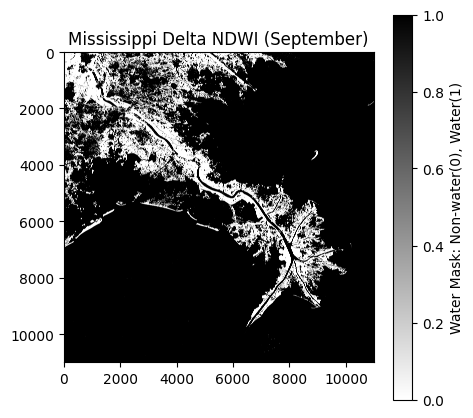

In [ ]:
# Plot the NDWI mask

plt.figure(figsize=(5,5))
plt.title('Mississippi Delta NDWI (September)')
plt.imshow(M_09_mask_ndwi, cmap='binary',vmin=0, vmax=1)
plt.colorbar(label='Water Mask: Non-water(0), Water(1)')

# plt.savefig("/content/drive/MyDrive/GEOL0069/Final/M_NDWI_09_Mask.png")
plt.show()


In [ ]:
end = time.time()
print(f"Total time used: {(end - start)/3600:.3f} hours")

Total time used: 0.013 hours


In [ ]:
import time
start = time.time()

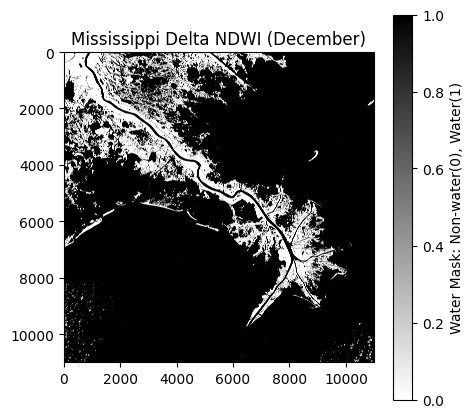

In [ ]:

plt.figure(figsize=(5,5))
plt.title('Mississippi Delta NDWI (December)')
plt.imshow(M_12_mask_ndwi, cmap='binary',vmin=0, vmax=1)
plt.colorbar(label='Water Mask: Non-water(0), Water(1)')

# plt.savefig("/content/drive/MyDrive/GEOL0069/Final/M_NDWI_12_Mask.png")
plt.show()


Classification Report:
               precision    recall  f1-score   support

           0       0.83      0.91      0.87  17503412
           1       0.98      0.97      0.98 103056988

    accuracy                           0.96 120560400
   macro avg       0.91      0.94      0.92 120560400
weighted avg       0.96      0.96      0.96 120560400



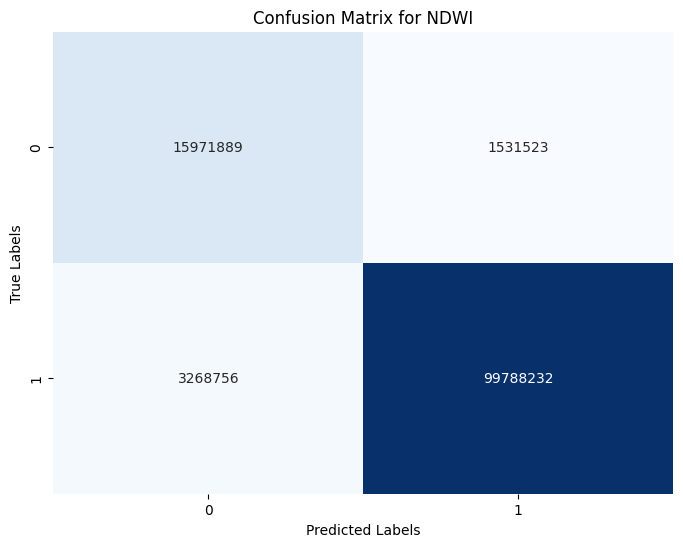

Accuracy: 0.96


In [ ]:
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.metrics import confusion_matrix, accuracy_score, classification_report


# Set threshold
threshold = 0.0

# Calculate the binary mask
M_09_mask_ndwi = (M_09_mask_ndwi > threshold).astype(np.uint8)
M_12_mask_ndwi = (M_12_mask_ndwi > threshold).astype(np.uint8)

# Flattening mask array
M_09_mask_ndwi_flat = M_09_mask_ndwi.flatten()
M_12_mask_ndwi_flat = M_12_mask_ndwi.flatten()

# Calculate confusion matrix
cm_ndwi = confusion_matrix(M_09_mask_ndwi_flat, M_12_mask_ndwi_flat)

# calculate accuracy
accuracy = accuracy_score(M_09_mask_ndwi_flat, M_12_mask_ndwi_flat)

# Display classification report
report = classification_report(M_09_mask_ndwi_flat, M_12_mask_ndwi_flat)
print("Classification Report:\n", report)

# Plot confusion matrix
plt.figure(figsize=(8, 6))
sns.heatmap(cm_ndwi, annot=True, fmt="d", cmap="Blues", cbar=False)
plt.title("Confusion Matrix for NDWI")
plt.xlabel("Predicted Labels")
plt.ylabel("True Labels")
plt.show()

# Print accuracy score
print(f"Accuracy: {accuracy:.2f}")

In [ ]:
end = time.time()
print(f"Total time used: {(end - start)/3600:.3f} hours")

Total time used: 0.023 hours


✅ As the shown in the masks, there is not much difference between them, and confusion matrix also presents a high accuracy rate, 96%, indicating that the water body changes in the Mississippi River Delta are not significant. The running duration of this part is 0.023 hours.

### 🔧 K-means Clustering Algorithm Based on NDWI
The following code visualises several bands required for calculating NDWI, **Band 3 (Green) and Band 8 (NIR)**, then performs the k-mean algorithm based on NDWI and visualises the water bodies mask. The k-mean mask based on NDWI data is compared with the basic mask, and the comparison results are displayed using a confusion matrix.


In [ ]:
import time
start = time.time()

In [ ]:
import rasterio
import numpy as np
import matplotlib.pyplot as plt

# Load NDWI band stack (Green + NIR)
M_09_ndwi_band_stack = np.load('/content/drive/MyDrive/GEOL0069/Final/M_09_ndwi_band_stack.npy')

# Load the valid pixel mask
M_09_ndwi_valid_data_mask = np.load('/content/drive/MyDrive/GEOL0069/Final/M_09_ndwi_valid_data_mask.npy')

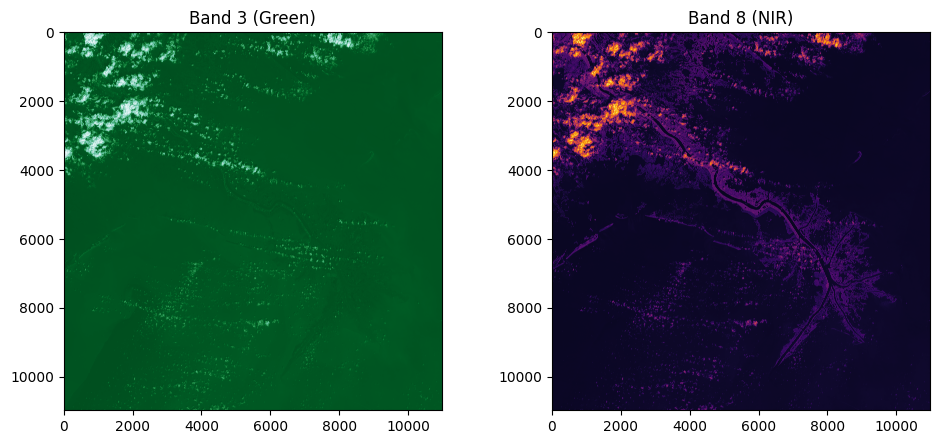

In [ ]:
# Visual representation of bands
fig, (ax1, ax2) = plt.subplots(1, 2)

ax1.imshow(M_09_ndwi_band_stack[:,:,0], cmap='BuGn_r')  # Plot on the first subplot (ax1)
ax1.set_title('Band 3 (Green)')

ax2.imshow(M_09_ndwi_band_stack[:,:,1], cmap= 'inferno')  # Plot on the second subplot (ax2)
ax2.set_title('Band 8 (NIR)')


plt.tight_layout()
fig.set_size_inches(10, 5)
plt.show()

In [ ]:
import json

# Load the dictionary from the saved JSON file
json_file_path = '/content/drive/MyDrive/GEOL0069/Final/M_09_ndwi_base_paths.json'

with open(json_file_path, 'r') as json_file:
    M_09_ndwi_base_paths = json.load(json_file)

In [ ]:
import rasterio
import numpy as np
from sklearn.cluster import KMeans
import matplotlib.pyplot as plt


M_09_ndwi_path = '/content/drive/MyDrive/GEOL0069/Final/M_09_ndwi.tif'

# Load the saved NDWI mask from the GeoTIFF file
with rasterio.open(M_09_ndwi_path) as src:
    M_09_ndwi = src.read(1)
    nodata_val = src.nodata

# Reshape for K-means, only including valid data
X_ndwi = M_09_ndwi[M_09_ndwi_valid_data_mask].reshape((-1, 1))

# K-means clustering
kmeans = KMeans(n_clusters=2, random_state=0).fit(X_ndwi)
labels = kmeans.labels_

mean_cluster_values = [X_ndwi[labels == i].mean() for i in range(2)]

# Reverse the labels if needed to make sure water is labeled as 1
if mean_cluster_values[0] > mean_cluster_values[1]:
    labels = 1 - labels

# Create an empty array for the result, filled with a no-data value (e.g., -1)
labels_image_ndwi = np.full(M_09_ndwi_band_stack.shape[:2], -1, dtype=int)

# Place cluster labels in the locations corresponding to valid data
labels_image_ndwi[M_09_ndwi_valid_data_mask] = labels

In [ ]:
import rasterio
import numpy as np

# Define file path to save the NDWI mask
labels_image_ndwi_path = '/content/drive/MyDrive/GEOL0069/Final/labels_image_ndwi_M.tif'

# Save the NDWI mask as a GeoTIFF
with rasterio.open(M_09_ndwi_base_paths['B3']) as src:  # Read one of the source bands to get metadata
    meta = src.meta  # Get metadata from the source image (e.g., CRS, transform, etc.)

    # Update metadata for the new file (1 band, uint8 type)
    meta.update(dtype=rasterio.int16, count=1, nodata=-1)

    # Save the NDWI mask as GeoTIFF
    with rasterio.open(labels_image_ndwi_path, 'w', **meta) as dst:
      dst.write(labels_image_ndwi, 1)  # Write the NDWI mask to the first band

In [ ]:
end = time.time()
print(f"Total time used: {(end - start)/3600:.3f} hours")

Total time used: 0.026 hours


In [ ]:
import time
start = time.time()

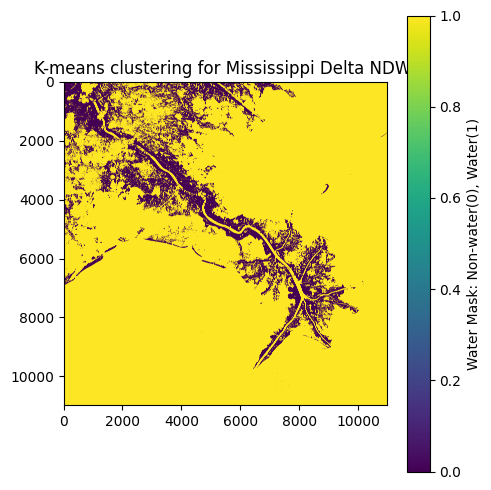

In [ ]:
import rasterio
import matplotlib.pyplot as plt
import numpy as np

labels_image_ndwi_path = '/content/drive/MyDrive/GEOL0069/Final/labels_image_ndwi_M.tif'

# Load the saved NDWI mask from the GeoTIFF file
with rasterio.open(labels_image_ndwi_path) as src:
    labels_image_ndwi = src.read(1)
    nodata_val = src.nodata

# Mask
labels_image_ndwi = np.ma.masked_where(labels_image_ndwi == nodata_val, labels_image_ndwi)

# Plot the NDWI mask
plt.figure(figsize=(5,5))

plt.imshow(labels_image_ndwi, cmap='viridis', vmin=0, vmax=1)
plt.title('K-means clustering for Mississippi Delta NDWI')
plt.colorbar(label='Water Mask: Non-water(0), Water(1)')

plt.tight_layout()
#plt.savefig("/content/drive/MyDrive/GEOL0069/Final/M_NDWI_kmean.png")
plt.show()

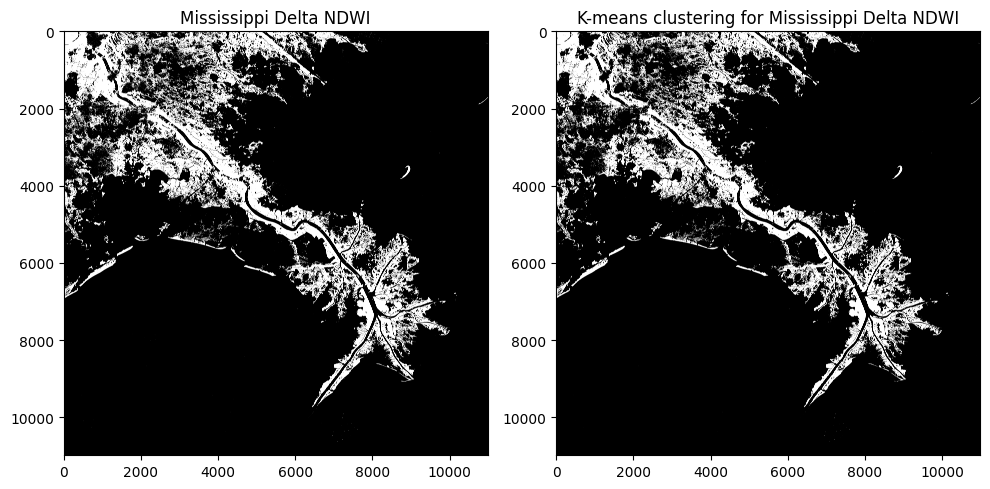

In [ ]:
import rasterio
import matplotlib.pyplot as plt

M_09_mask_ndwi_path = '/content/drive/MyDrive/GEOL0069/Final/Mississippi_9/M_09_mask_ndwi.tif'

# Load the saved NDWI mask from the GeoTIFF file
with rasterio.open(M_09_mask_ndwi_path) as src:
    M_09_mask_ndwi = src.read(1)  # Read the first band

# Plot the NDWI mask
plt.figure(figsize=(10,5))

plt.subplot(1, 2, 1)
plt.title('Mississippi Delta NDWI')
plt.imshow(M_09_mask_ndwi, cmap='binary', vmin=0, vmax=1)

plt.subplot(1, 2, 2)
plt.imshow(labels_image_ndwi, cmap='binary', vmin=0, vmax=1)
plt.title('K-means clustering for Mississippi Delta NDWI')

plt.tight_layout()
#plt.savefig("/content/drive/MyDrive/GEOL0069/Final/M_NDWI.png")
plt.show()

Classification Report:
               precision    recall  f1-score   support

           0       0.99      0.93      0.96  17503412
           1       0.99      1.00      0.99 103056988

    accuracy                           0.99 120560400
   macro avg       0.99      0.96      0.98 120560400
weighted avg       0.99      0.99      0.99 120560400



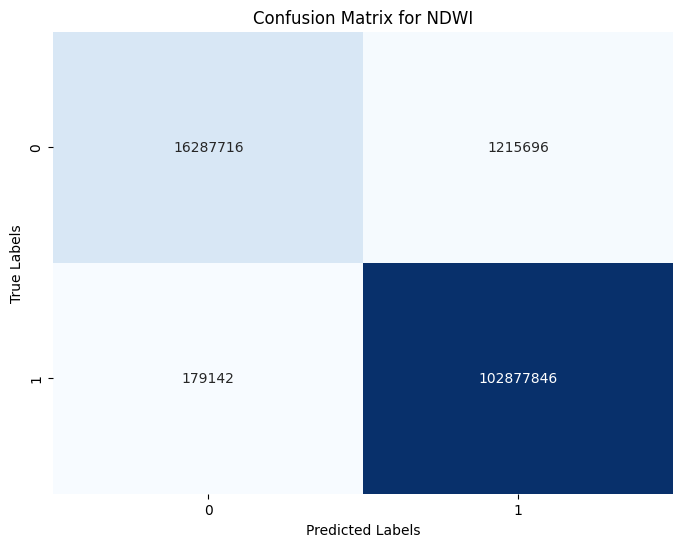

Accuracy: 0.99


In [ ]:
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.metrics import confusion_matrix, accuracy_score, classification_report

# Set threshold
threshold = 0.0

# Ensure that both arrays are numpy arrays and not masked arrays
M_09_mask_ndwi = np.ma.filled(M_09_mask_ndwi, 0)  # Convert to normal array, filling masked values with 0
labels_image_ndwi = np.ma.filled(labels_image_ndwi, 0)  # Same here for labels_image_ndwi

# Calculate the binary mask (Ensure both arrays are binary)
M_09_mask_ndwi = (M_09_mask_ndwi > threshold).astype(np.uint8)
labels_image_ndwi = (labels_image_ndwi > threshold).astype(np.uint8)

# Flattening mask array
M_09_mask_ndwi_flat = M_09_mask_ndwi.flatten()
labels_image_ndwi_flat = labels_image_ndwi.flatten()

# Calculate confusion matrix
cm_ndwi = confusion_matrix(M_09_mask_ndwi_flat, labels_image_ndwi_flat)

# Calculate accuracy
accuracy = accuracy_score(M_09_mask_ndwi_flat, labels_image_ndwi_flat)

# Display classification report
report = classification_report(M_09_mask_ndwi_flat, labels_image_ndwi_flat)
print("Classification Report:\n", report)

# Plot confusion matrix
plt.figure(figsize=(8, 6))
sns.heatmap(cm_ndwi, annot=True, fmt="d", cmap="Blues", cbar=False)
plt.title("Confusion Matrix for NDWI")
plt.xlabel("Predicted Labels")
plt.ylabel("True Labels")
plt.show()

# Print accuracy score
print(f"Accuracy: {accuracy:.2f}")

In [ ]:
end = time.time()
print(f"Total time used: {(end - start)/3600:.3f} hours")

Total time used: 0.044 hours


✅ It can be seen from the generated masks that the result of k-mean based on NDWI is very similar to the result using NDWI, with an accuracy rate of 99%. The running time of this code is 0.041 hours.

# 🌍 Environmental Costs Assessment
During the operation of colab, GPU T4 was used. According to the data, the power of T4 is 70W, the average carbon emission level is 0.22kg, and the time of previous operation calculations can be used to calculate the carbon emissions generated by running codes.

$$\text{Emissions} = \text{Times} * \text{Power} * \text{Intensity},$$



In [ ]:
# Add up the total time calculated earlier
gpu_hours = 0.147 + 0.051 +0.014+0.021+0.031+0.051+0.076+0.051+0.013+0.023+0.026+0.044

# Define GPU power consumption (70W in T4) and carbon emission factor (global average 0.475kg /kWh)
gpu_power_kw = 0.07  # kW
carbon_intensity = 0.22  # kg CO2 per kWh

# Calculate total carbon emissions
emissions_kg = gpu_hours * gpu_power_kw * carbon_intensity

# Output result
print(f"Total GPU runtime: {gpu_hours:.2f} hours")
print(f"Estimated CO2 emissions: {emissions_kg:.4f} kg CO2")

Total GPU runtime: 0.55 hours
Estimated CO2 emissions: 0.0084 kg CO2


♻️ The total carbon emissions is 0.0084kg. The environmental cost of this research project is relatively low because it mainly relies on the use of free provided satellite remote sensing data and calculation methods, and does not require on-site work or consumable resources.

# ✅ Conclusion
This project mainly used three water body index methods, **AWEI, MNDWI and NDWI**. The results showed that **in the complex delta environment**:
-  The results show **AWEI and MNDWI** are **better** for analysing this environment.
- The classification of **AWEI** is more detailed, but **inappropriate thresholds** can lead to incorrect classification of water bodies.
- In contrast, **NDWI** may be more susceptible to the influence of **sediments**, leading to classification errors.
- The classification formed by combining the three indices with **k-mean** is more accurate, minimising classification errors caused by interference from other factors.
-This emphasises the **effectiveness and reliability** of the method combining **unsupervised learning and remote sensing methods** for environmental monitoring.


**In terms of the environment cost**: This project demonstrates an environmentally responsible research approach that utilises open access to Earth observation data and efficient algorithms to conduct large-scale monitoring of water bodies with minimal environmental impact. Further efforts to reduce energy consumption can enhance the sustainability of future work.


# 📚 References
- Akter, J., Sarker, M. H., Popescu, I., & Roelvink, D. (2016). Evolution of the Bengal Delta and its prevailing processes. Journal of Coastal Research, 32(5), 1212-1226.

- Blum, M. D., & Roberts, H. H. (2012). The Mississippi delta region: past, present, and future. Annual Review of Earth and Planetary Sciences, 40(1), 655-683.

- Edmonds, D. A., Caldwell, R. L., Brondizio, E. S., & Siani, S. M. (2020). Coastal flooding will disproportionately impact people on river deltas. Nature communications, 11(1), 4741.

- Feyisa, G. L., Meilby, H., Fensholt, R., & Proud, S. R. (2014). Automated Water Extraction Index: A new technique for surface water mapping using Landsat imagery. Remote sensing of environment, 140, 23-35.

- Ghosh, A., Das, S., Ghosh, T., & Hazra, S. (2019). Risk of extreme events in delta environment: A case study of the Mahanadi delta. Science of the Total Environment, 664, 713-723.

- MacQueen, J. (1967, January). Some methods for classification and analysis of multivariate observations. In Proceedings of the Fifth Berkeley Symposium on Mathematical Statistics and Probability, Volume 1: Statistics (Vol. 5, pp. 281-298). University of California press.

- McFeeters, S. K. (1996). The use of the Normalized Difference Water Index (NDWI) in the delineation of open water features. International journal of remote sensing, 17(7), 1425-1432.

- New 2024 UK Grid Emissions Factors (2024), from https://www.itpenergised.com/new-2024-uk-grid-emissions-factors/, assessed on April 18th, 2025.

- Twilley, R. R., Bentley, S. J., Chen, Q., Edmonds, D. A., Hagen, S. C., Lam, N. S. N., ... & McCall, A. (2016). Co-evolution of wetland landscapes, flooding, and human settlement in the Mississippi River Delta Plain. Sustainability science, 11, 711-731.

- Xu, H. (2006). Modification of normalised difference water index (NDWI) to enhance open water features in remotely sensed imagery. International journal of remote sensing, 27(14), 3025-3033.